# Face Generation
In this project, you'll use generative adversarial networks to generate new images of faces.
### Get the Data
You'll be using two datasets in this project:
- MNIST
- CelebA

Since the celebA dataset is complex and you're doing GANs in a project for the first time, we want you to test your neural network on MNIST before CelebA.  Running the GANs on MNIST will allow you to see how well your model trains sooner.

If you're using [FloydHub](https://www.floydhub.com/), set `data_dir` to "/input" and use the [FloydHub data ID](http://docs.floydhub.com/home/using_datasets/) "R5KrjnANiKVhLWAkpXhNBe".

In [38]:
data_dir = '/input'

# FloydHub - Use with data ID "R5KrjnANiKVhLWAkpXhNBe"
#data_dir = '/input'


"""
DON'T MODIFY ANYTHING IN THIS CELL
"""
import helper

helper.download_extract('mnist', data_dir)
helper.download_extract('celeba', data_dir)

Found mnist Data
Found celeba Data


## Explore the Data
### MNIST
As you're aware, the [MNIST](http://yann.lecun.com/exdb/mnist/) dataset contains images of handwritten digits. You can view the first number of examples by changing `show_n_images`. 

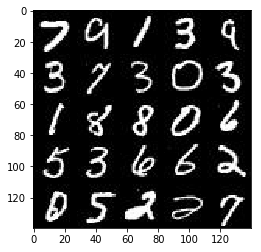

In [39]:
show_n_images = 25

"""
DON'T MODIFY ANYTHING IN THIS CELL
"""
%matplotlib inline
import os
from glob import glob
from matplotlib import pyplot

mnist_images = helper.get_batch(glob(os.path.join(data_dir, 'mnist/*.jpg'))[:show_n_images], 28, 28, 'L')
pyplot.imshow(helper.images_square_grid(mnist_images, 'L'), cmap='gray')

### CelebA
The [CelebFaces Attributes Dataset (CelebA)](http://mmlab.ie.cuhk.edu.hk/projects/CelebA.html) dataset contains over 200,000 celebrity images with annotations.  Since you're going to be generating faces, you won't need the annotations.  You can view the first number of examples by changing `show_n_images`.

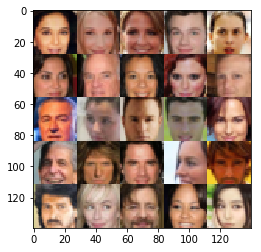

In [40]:
show_n_images = 25

"""
DON'T MODIFY ANYTHING IN THIS CELL
"""
mnist_images = helper.get_batch(glob(os.path.join(data_dir, 'img_align_celeba/*.jpg'))[:show_n_images], 28, 28, 'RGB')
pyplot.imshow(helper.images_square_grid(mnist_images, 'RGB'))

## Preprocess the Data
Since the project's main focus is on building the GANs, we'll preprocess the data for you.  The values of the MNIST and CelebA dataset will be in the range of -0.5 to 0.5 of 28x28 dimensional images.  The CelebA images will be cropped to remove parts of the image that don't include a face, then resized down to 28x28.

The MNIST images are black and white images with a single [color channel](https://en.wikipedia.org/wiki/Channel_(digital_image%29) while the CelebA images have [3 color channels (RGB color channel)](https://en.wikipedia.org/wiki/Channel_(digital_image%29#RGB_Images).
## Build the Neural Network
You'll build the components necessary to build a GANs by implementing the following functions below:
- `model_inputs`
- `discriminator`
- `generator`
- `model_loss`
- `model_opt`
- `train`

### Check the Version of TensorFlow and Access to GPU
This will check to make sure you have the correct version of TensorFlow and access to a GPU

In [41]:
"""
DON'T MODIFY ANYTHING IN THIS CELL
"""
from distutils.version import LooseVersion
import warnings
import tensorflow as tf

# Check TensorFlow Version
assert LooseVersion(tf.__version__) >= LooseVersion('1.0'), 'Please use TensorFlow version 1.0 or newer.  You are using {}'.format(tf.__version__)
print('TensorFlow Version: {}'.format(tf.__version__))

# Check for a GPU
if not tf.test.gpu_device_name():
    warnings.warn('No GPU found. Please use a GPU to train your neural network.')
else:
    print('Default GPU Device: {}'.format(tf.test.gpu_device_name()))

TensorFlow Version: 1.1.0
Default GPU Device: /gpu:0


### Input
Implement the `model_inputs` function to create TF Placeholders for the Neural Network. It should create the following placeholders:
- Real input images placeholder with rank 4 using `image_width`, `image_height`, and `image_channels`.
- Z input placeholder with rank 2 using `z_dim`.
- Learning rate placeholder with rank 0.

Return the placeholders in the following the tuple (tensor of real input images, tensor of z data)

In [42]:
import problem_unittests as tests

def model_inputs(image_width, image_height, image_channels, z_dim):
    """
    Create the model inputs
    :param image_width: The input image width
    :param image_height: The input image height
    :param image_channels: The number of image channels
    :param z_dim: The dimension of Z
    :return: Tuple of (tensor of real input images, tensor of z data, learning rate)
    """
    # TODO: Implement Function
    input_ph = tf.placeholder(tf.float32, shape=(None, image_width, image_height, image_channels))
    z_ph = tf.placeholder(tf.float32, shape=(None, z_dim))
    lr_ph = tf.placeholder(tf.float32)
    return input_ph, z_ph, lr_ph



"""
DON'T MODIFY ANYTHING IN THIS CELL THAT IS BELOW THIS LINE
"""
tests.test_model_inputs(model_inputs)

Tests Passed


### Discriminator
Implement `discriminator` to create a discriminator neural network that discriminates on `images`.  This function should be able to reuse the variables in the neural network.  Use [`tf.variable_scope`](https://www.tensorflow.org/api_docs/python/tf/variable_scope) with a scope name of "discriminator" to allow the variables to be reused.  The function should return a tuple of (tensor output of the discriminator, tensor logits of the discriminator).

In [43]:
def discriminator(images, reuse=False):
    """
    Create the discriminator network
    :param image: Tensor of input image(s)
    :param reuse: Boolean if the weights should be reused
    :return: Tuple of (tensor output of the discriminator, tensor logits of the discriminator)
    """
    # TODO: Implement Function
    with tf.variable_scope("discriminator", reuse = reuse):

        alpha=0.2
        
        x1 = tf.layers.conv2d(images, 128, 5, strides=2, padding='same', kernel_initializer=tf.random_normal_initializer(stddev=0.05))
        n1 = tf.layers.batch_normalization(x1, training=True)
        relu1 = tf.maximum(alpha * n1, n1)

        x2 = tf.layers.conv2d(relu1, 256, 5, strides=2, padding='same', kernel_initializer=tf.random_normal_initializer(stddev=0.05))
        n2 = tf.layers.batch_normalization(x2, training=True)
        relu2 = tf.maximum(alpha * n2, n2)
       
        x3 = tf.layers.conv2d(relu2, 512, 5, strides=2, padding='same', kernel_initializer=tf.random_normal_initializer(stddev=0.05))
        n3 = tf.layers.batch_normalization(x3, training=True)
        relu3 = tf.maximum(alpha * n3, n3)

        flat = tf.contrib.layers.flatten(relu3)
        logits = tf.layers.dense(flat, 1)
        out = tf.sigmoid(logits)

    return out, logits


"""
DON'T MODIFY ANYTHING IN THIS CELL THAT IS BELOW THIS LINE
"""
tests.test_discriminator(discriminator, tf)

Tests Passed


### Generator
Implement `generator` to generate an image using `z`. This function should be able to reuse the variables in the neural network.  Use [`tf.variable_scope`](https://www.tensorflow.org/api_docs/python/tf/variable_scope) with a scope name of "generator" to allow the variables to be reused. The function should return the generated 28 x 28 x `out_channel_dim` images.

In [44]:
def generator(z, out_channel_dim, is_train=True):
    """
    Create the generator network
    :param z: Input z
    :param out_channel_dim: The number of channels in the output image
    :param is_train: Boolean if generator is being used for training
    :return: The tensor output of the generator
    """
    # TODO: Implement Function
    alpha = 0.2
    with tf.variable_scope('generator', reuse=not is_train):
        x1 = tf.layers.dense(z, 7*7*512, activation=None)

        x1 = tf.reshape(x1, (-1, 7, 7, 512))
        x1 = tf.layers.batch_normalization(x1, training=is_train)
        x1 = tf.maximum(alpha * x1, x1)
        
        x2 = tf.layers.conv2d_transpose(x1, 256, 5, strides=2, padding='same', activation=None)
        x2 = tf.layers.batch_normalization(x2, training=is_train)
        x2 = tf.maximum(alpha * x2, x2)
        
        x3 = tf.layers.conv2d_transpose(x2, 128, 5, strides=1, padding='same', activation=None)
        x3 = tf.layers.batch_normalization(x3, training=is_train)
        x3 = tf.maximum(alpha * x3, x3)

        logits = tf.layers.conv2d_transpose(x3, out_channel_dim, 5, strides=2, padding='same', activation=None)
        
        out = tf.tanh(logits)
    
    return out


"""
DON'T MODIFY ANYTHING IN THIS CELL THAT IS BELOW THIS LINE
"""
tests.test_generator(generator, tf)

Tests Passed


### Loss
Implement `model_loss` to build the GANs for training and calculate the loss.  The function should return a tuple of (discriminator loss, generator loss).  Use the following functions you implemented:
- `discriminator(images, reuse=False)`
- `generator(z, out_channel_dim, is_train=True)`

In [45]:
def model_loss(input_real, input_z, out_channel_dim):
    """
    Get the loss for the discriminator and generator
    :param input_real: Images from the real dataset
    :param input_z: Z input
    :param out_channel_dim: The number of channels in the output image
    :return: A tuple of (discriminator loss, generator loss)
    """
    # TODO: Implement Function
    g_model = generator(input_z, out_channel_dim)

    d_model_real, d_logits_real = discriminator(input_real)
    d_model_fake, d_logits_fake = discriminator(g_model, reuse=True)

    d_loss_real = tf.reduce_mean(
        tf.nn.sigmoid_cross_entropy_with_logits(logits=d_logits_real, labels=tf.ones_like(d_model_real)))
    d_loss_fake = tf.reduce_mean(
        tf.nn.sigmoid_cross_entropy_with_logits(logits=d_logits_fake, labels=tf.zeros_like(d_model_fake)))
    g_loss = tf.reduce_mean(
        tf.nn.sigmoid_cross_entropy_with_logits(logits=d_logits_fake, labels=tf.ones_like(d_model_fake)))

    d_loss = d_loss_real + d_loss_fake

    return d_loss, g_loss


"""
DON'T MODIFY ANYTHING IN THIS CELL THAT IS BELOW THIS LINE
"""
tests.test_model_loss(model_loss)

Tests Passed


### Optimization
Implement `model_opt` to create the optimization operations for the GANs. Use [`tf.trainable_variables`](https://www.tensorflow.org/api_docs/python/tf/trainable_variables) to get all the trainable variables.  Filter the variables with names that are in the discriminator and generator scope names.  The function should return a tuple of (discriminator training operation, generator training operation).

In [46]:
def model_opt(d_loss, g_loss, learning_rate, beta1):
    """
    Get optimization operations
    :param d_loss: Discriminator loss Tensor
    :param g_loss: Generator loss Tensor
    :param learning_rate: Learning Rate Placeholder
    :param beta1: The exponential decay rate for the 1st moment in the optimizer
    :return: A tuple of (discriminator training operation, generator training operation)
    """
    # TODO: Implement Function
    t_vars = tf.trainable_variables()
    d_vars = [var for var in t_vars if var.name.startswith('discriminator')]
    g_vars = [var for var in t_vars if var.name.startswith('generator')]

    
    d_train_opt = tf.train.AdamOptimizer(learning_rate, beta1 = beta1).minimize(d_loss, var_list=d_vars)

    with tf.control_dependencies(tf.get_collection(tf.GraphKeys.UPDATE_OPS)):
        g_train_opt = tf.train.AdamOptimizer(learning_rate, beta1=beta1).minimize(g_loss, var_list=g_vars)
    
    return d_train_opt, g_train_opt


"""
DON'T MODIFY ANYTHING IN THIS CELL THAT IS BELOW THIS LINE
"""
tests.test_model_opt(model_opt, tf)

Tests Passed


## Neural Network Training
### Show Output
Use this function to show the current output of the generator during training. It will help you determine how well the GANs is training.

In [47]:
"""
DON'T MODIFY ANYTHING IN THIS CELL
"""
import numpy as np

def show_generator_output(sess, n_images, input_z, out_channel_dim, image_mode):
    """
    Show example output for the generator
    :param sess: TensorFlow session
    :param n_images: Number of Images to display
    :param input_z: Input Z Tensor
    :param out_channel_dim: The number of channels in the output image
    :param image_mode: The mode to use for images ("RGB" or "L")
    """
    cmap = None if image_mode == 'RGB' else 'gray'
    z_dim = input_z.get_shape().as_list()[-1]
    example_z = np.random.uniform(-1, 1, size=[n_images, z_dim])

    samples = sess.run(
        generator(input_z, out_channel_dim, False),
        feed_dict={input_z: example_z})

    images_grid = helper.images_square_grid(samples, image_mode)
    pyplot.imshow(images_grid, cmap=cmap)
    pyplot.show()

### Train
Implement `train` to build and train the GANs.  Use the following functions you implemented:
- `model_inputs(image_width, image_height, image_channels, z_dim)`
- `model_loss(input_real, input_z, out_channel_dim)`
- `model_opt(d_loss, g_loss, learning_rate, beta1)`

Use the `show_generator_output` to show `generator` output while you train. Running `show_generator_output` for every batch will drastically increase training time and increase the size of the notebook.  It's recommended to print the `generator` output every 100 batches.

In [48]:
def train(epoch_count, batch_size, z_dim, learning_rate, beta1, get_batches, data_shape, data_image_mode):
    """
    Train the GAN
    :param epoch_count: Number of epochs
    :param batch_size: Batch Size
    :param z_dim: Z dimension
    :param learning_rate: Learning Rate
    :param beta1: The exponential decay rate for the 1st moment in the optimizer
    :param get_batches: Function to get batches
    :param data_shape: Shape of the data
    :param data_image_mode: The image mode to use for images ("RGB" or "L")
    """
    # TODO: Build Model
    steps = 0
    _, image_width, image_height, image_channels = data_shape
    input_real, input_z, lr = model_inputs(image_width, image_height,image_channels, z_dim)
    d_loss, g_loss = model_loss(input_real, input_z,image_channels)
    d_opt, g_opt = model_opt(d_loss, g_loss, lr, beta1)
    
    is_train = tf.placeholder(tf.bool)
    
    with tf.Session() as sess:
        sess.run(tf.global_variables_initializer())
        for epoch_i in range(epoch_count):
            for batch_images in get_batches(batch_size):
                steps += 1
                batch_images = batch_images * 2
                batch_z = np.random.uniform(-1, 1, size=(batch_size, z_dim))
                _ = sess.run(d_opt, feed_dict={input_real: batch_images, input_z: batch_z, lr:learning_rate})
                _ = sess.run(g_opt, feed_dict={input_real: batch_images, input_z: batch_z, lr:learning_rate,is_train:True})
                _ = sess.run(g_opt, feed_dict={input_real: batch_images, input_z: batch_z, lr:learning_rate,is_train:False})
                
                if steps % 10 == 0:
                    train_loss_d = d_loss.eval({input_z: batch_z, input_real: batch_images})
                    train_loss_g = g_loss.eval({input_z: batch_z})

                    print("Epoch {}/{}...".format(epoch_i+1, epoch_count),
                          "Discriminator Loss: {:.4f}...".format(train_loss_d),
                          "Generator Loss: {:.4f}".format(train_loss_g))

                if steps % 100 == 0:
                    show_generator_output(sess, 50, input_z, image_channels, data_image_mode)

### MNIST
Test your GANs architecture on MNIST.  After 2 epochs, the GANs should be able to generate images that look like handwritten digits.  Make sure the loss of the generator is lower than the loss of the discriminator or close to 0.

Epoch 1/2... Discriminator Loss: 3.9037... Generator Loss: 0.0283
Epoch 1/2... Discriminator Loss: 3.4323... Generator Loss: 0.0483
Epoch 1/2... Discriminator Loss: 3.8725... Generator Loss: 0.0524
Epoch 1/2... Discriminator Loss: 3.4969... Generator Loss: 0.0546
Epoch 1/2... Discriminator Loss: 3.1753... Generator Loss: 0.1044
Epoch 1/2... Discriminator Loss: 3.1056... Generator Loss: 0.0953
Epoch 1/2... Discriminator Loss: 3.6433... Generator Loss: 0.0654
Epoch 1/2... Discriminator Loss: 3.2119... Generator Loss: 0.0939
Epoch 1/2... Discriminator Loss: 2.7393... Generator Loss: 0.1212
Epoch 1/2... Discriminator Loss: 2.5123... Generator Loss: 0.1805


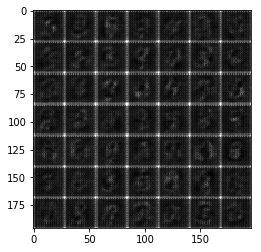

Epoch 1/2... Discriminator Loss: 2.7986... Generator Loss: 0.0959
Epoch 1/2... Discriminator Loss: 2.5211... Generator Loss: 0.1484
Epoch 1/2... Discriminator Loss: 2.4593... Generator Loss: 0.3256
Epoch 1/2... Discriminator Loss: 2.4161... Generator Loss: 0.2165
Epoch 1/2... Discriminator Loss: 2.1411... Generator Loss: 0.2508
Epoch 1/2... Discriminator Loss: 2.1853... Generator Loss: 0.2674
Epoch 1/2... Discriminator Loss: 2.1914... Generator Loss: 0.1634
Epoch 1/2... Discriminator Loss: 1.9466... Generator Loss: 0.3899
Epoch 1/2... Discriminator Loss: 2.1149... Generator Loss: 0.1756
Epoch 1/2... Discriminator Loss: 1.9747... Generator Loss: 0.2827


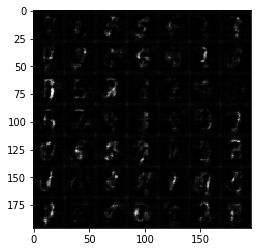

Epoch 1/2... Discriminator Loss: 1.8662... Generator Loss: 0.3962
Epoch 1/2... Discriminator Loss: 1.9741... Generator Loss: 0.2557
Epoch 1/2... Discriminator Loss: 1.8852... Generator Loss: 0.4415
Epoch 1/2... Discriminator Loss: 1.8350... Generator Loss: 0.3834
Epoch 1/2... Discriminator Loss: 1.9563... Generator Loss: 0.2160
Epoch 1/2... Discriminator Loss: 2.0522... Generator Loss: 0.2488
Epoch 1/2... Discriminator Loss: 1.5756... Generator Loss: 0.4309
Epoch 1/2... Discriminator Loss: 1.5142... Generator Loss: 0.5533
Epoch 1/2... Discriminator Loss: 1.9798... Generator Loss: 0.1932
Epoch 1/2... Discriminator Loss: 1.6071... Generator Loss: 0.3907


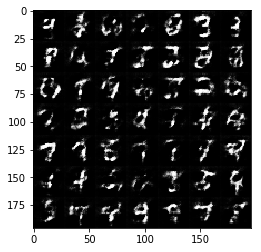

Epoch 1/2... Discriminator Loss: 1.4761... Generator Loss: 0.3771
Epoch 1/2... Discriminator Loss: 1.8157... Generator Loss: 0.2429
Epoch 1/2... Discriminator Loss: 1.4832... Generator Loss: 0.5441
Epoch 1/2... Discriminator Loss: 1.7215... Generator Loss: 0.2882
Epoch 1/2... Discriminator Loss: 1.9787... Generator Loss: 0.2431
Epoch 1/2... Discriminator Loss: 1.7778... Generator Loss: 0.3455
Epoch 1/2... Discriminator Loss: 1.9641... Generator Loss: 0.5678
Epoch 1/2... Discriminator Loss: 1.7707... Generator Loss: 0.4206
Epoch 1/2... Discriminator Loss: 1.6020... Generator Loss: 0.6479
Epoch 1/2... Discriminator Loss: 1.6981... Generator Loss: 0.4324


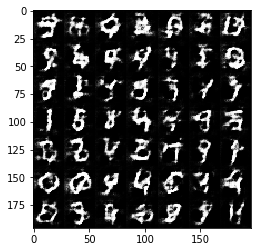

Epoch 1/2... Discriminator Loss: 1.7313... Generator Loss: 0.4505
Epoch 1/2... Discriminator Loss: 1.7066... Generator Loss: 0.3753
Epoch 1/2... Discriminator Loss: 1.8721... Generator Loss: 0.5422
Epoch 1/2... Discriminator Loss: 1.7877... Generator Loss: 0.6335
Epoch 1/2... Discriminator Loss: 1.9881... Generator Loss: 0.2152
Epoch 1/2... Discriminator Loss: 1.8141... Generator Loss: 0.3097
Epoch 1/2... Discriminator Loss: 1.8687... Generator Loss: 0.3154
Epoch 1/2... Discriminator Loss: 1.8474... Generator Loss: 0.3799
Epoch 1/2... Discriminator Loss: 1.8784... Generator Loss: 0.2986
Epoch 1/2... Discriminator Loss: 1.6699... Generator Loss: 0.4813


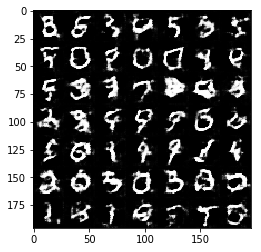

Epoch 1/2... Discriminator Loss: 2.0296... Generator Loss: 0.1858
Epoch 1/2... Discriminator Loss: 1.8550... Generator Loss: 0.2935
Epoch 1/2... Discriminator Loss: 1.4419... Generator Loss: 0.5151
Epoch 1/2... Discriminator Loss: 1.7770... Generator Loss: 0.2989
Epoch 1/2... Discriminator Loss: 1.6912... Generator Loss: 0.5843
Epoch 1/2... Discriminator Loss: 1.4363... Generator Loss: 0.4735
Epoch 1/2... Discriminator Loss: 2.1105... Generator Loss: 0.1930
Epoch 1/2... Discriminator Loss: 2.0309... Generator Loss: 0.2530
Epoch 1/2... Discriminator Loss: 1.5393... Generator Loss: 0.4234
Epoch 1/2... Discriminator Loss: 1.5192... Generator Loss: 0.7910


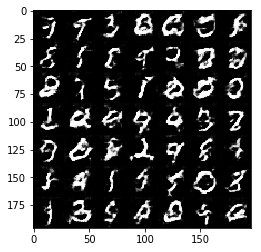

Epoch 1/2... Discriminator Loss: 1.7424... Generator Loss: 0.4640
Epoch 1/2... Discriminator Loss: 1.7087... Generator Loss: 0.3467
Epoch 1/2... Discriminator Loss: 1.6740... Generator Loss: 0.3473
Epoch 1/2... Discriminator Loss: 1.4640... Generator Loss: 0.4565
Epoch 1/2... Discriminator Loss: 1.7006... Generator Loss: 0.4948
Epoch 1/2... Discriminator Loss: 1.8831... Generator Loss: 0.2755
Epoch 1/2... Discriminator Loss: 1.6895... Generator Loss: 0.5586
Epoch 1/2... Discriminator Loss: 1.5926... Generator Loss: 0.4072
Epoch 1/2... Discriminator Loss: 1.7314... Generator Loss: 0.3420
Epoch 1/2... Discriminator Loss: 1.4556... Generator Loss: 0.6281


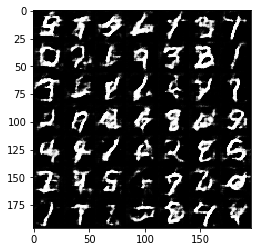

Epoch 1/2... Discriminator Loss: 2.0749... Generator Loss: 0.2231
Epoch 1/2... Discriminator Loss: 1.6569... Generator Loss: 0.3464
Epoch 1/2... Discriminator Loss: 1.7830... Generator Loss: 0.3405
Epoch 1/2... Discriminator Loss: 1.6916... Generator Loss: 0.7223
Epoch 1/2... Discriminator Loss: 1.6077... Generator Loss: 1.1097
Epoch 1/2... Discriminator Loss: 1.7505... Generator Loss: 0.3064
Epoch 1/2... Discriminator Loss: 1.7120... Generator Loss: 0.2988
Epoch 1/2... Discriminator Loss: 1.7278... Generator Loss: 0.5299
Epoch 1/2... Discriminator Loss: 1.7160... Generator Loss: 0.3612
Epoch 1/2... Discriminator Loss: 1.8884... Generator Loss: 0.6158


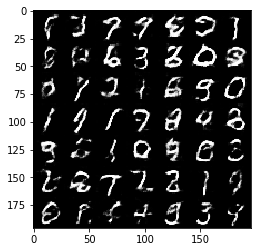

Epoch 1/2... Discriminator Loss: 1.5400... Generator Loss: 0.5819
Epoch 1/2... Discriminator Loss: 1.7010... Generator Loss: 0.3265
Epoch 1/2... Discriminator Loss: 1.4574... Generator Loss: 0.4563
Epoch 1/2... Discriminator Loss: 1.6664... Generator Loss: 0.4613
Epoch 1/2... Discriminator Loss: 1.7218... Generator Loss: 0.3682
Epoch 1/2... Discriminator Loss: 1.4757... Generator Loss: 0.5165
Epoch 1/2... Discriminator Loss: 1.4953... Generator Loss: 0.5351
Epoch 1/2... Discriminator Loss: 1.6654... Generator Loss: 0.5187
Epoch 1/2... Discriminator Loss: 1.6995... Generator Loss: 0.3204
Epoch 1/2... Discriminator Loss: 1.7802... Generator Loss: 0.2865


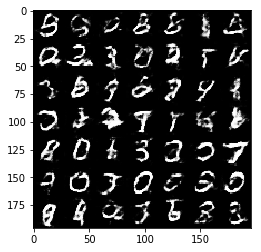

Epoch 1/2... Discriminator Loss: 1.6161... Generator Loss: 0.3227
Epoch 1/2... Discriminator Loss: 1.8172... Generator Loss: 0.2499
Epoch 1/2... Discriminator Loss: 1.6934... Generator Loss: 0.2640
Epoch 1/2... Discriminator Loss: 1.4463... Generator Loss: 0.9011
Epoch 1/2... Discriminator Loss: 1.6935... Generator Loss: 0.4540
Epoch 1/2... Discriminator Loss: 1.8669... Generator Loss: 0.3074
Epoch 1/2... Discriminator Loss: 1.7307... Generator Loss: 0.5191
Epoch 1/2... Discriminator Loss: 2.1756... Generator Loss: 0.2682
Epoch 1/2... Discriminator Loss: 1.8391... Generator Loss: 0.3087
Epoch 1/2... Discriminator Loss: 1.7603... Generator Loss: 0.3278


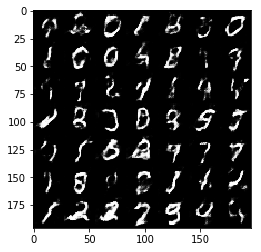

Epoch 1/2... Discriminator Loss: 1.7006... Generator Loss: 0.3556
Epoch 1/2... Discriminator Loss: 1.8372... Generator Loss: 0.2579
Epoch 1/2... Discriminator Loss: 1.6388... Generator Loss: 0.3319
Epoch 1/2... Discriminator Loss: 1.5206... Generator Loss: 0.4228
Epoch 1/2... Discriminator Loss: 1.4827... Generator Loss: 0.5416
Epoch 1/2... Discriminator Loss: 1.6727... Generator Loss: 0.4021
Epoch 1/2... Discriminator Loss: 1.6537... Generator Loss: 0.4395
Epoch 1/2... Discriminator Loss: 1.7616... Generator Loss: 0.2667
Epoch 1/2... Discriminator Loss: 1.5343... Generator Loss: 0.5080
Epoch 1/2... Discriminator Loss: 1.9322... Generator Loss: 0.2647


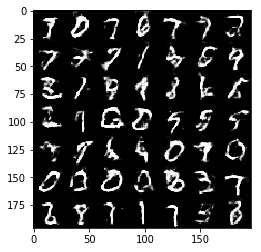

Epoch 1/2... Discriminator Loss: 1.4668... Generator Loss: 0.5366
Epoch 1/2... Discriminator Loss: 2.0657... Generator Loss: 0.1940
Epoch 1/2... Discriminator Loss: 1.9572... Generator Loss: 0.2247
Epoch 1/2... Discriminator Loss: 1.6656... Generator Loss: 0.3735
Epoch 1/2... Discriminator Loss: 1.6450... Generator Loss: 0.4217
Epoch 1/2... Discriminator Loss: 1.5462... Generator Loss: 0.3715
Epoch 1/2... Discriminator Loss: 1.5461... Generator Loss: 0.5078
Epoch 1/2... Discriminator Loss: 1.6988... Generator Loss: 0.5739
Epoch 1/2... Discriminator Loss: 1.7646... Generator Loss: 0.3459
Epoch 1/2... Discriminator Loss: 1.6673... Generator Loss: 0.3282


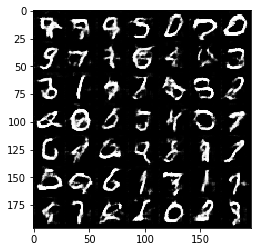

Epoch 1/2... Discriminator Loss: 1.7356... Generator Loss: 0.3325
Epoch 1/2... Discriminator Loss: 1.6348... Generator Loss: 0.5329
Epoch 1/2... Discriminator Loss: 1.6235... Generator Loss: 0.4030
Epoch 1/2... Discriminator Loss: 1.5422... Generator Loss: 0.7241
Epoch 1/2... Discriminator Loss: 1.3888... Generator Loss: 0.5180
Epoch 1/2... Discriminator Loss: 1.6391... Generator Loss: 0.3291
Epoch 1/2... Discriminator Loss: 1.7884... Generator Loss: 0.2802
Epoch 1/2... Discriminator Loss: 1.7486... Generator Loss: 0.3043
Epoch 1/2... Discriminator Loss: 1.7842... Generator Loss: 0.2501
Epoch 1/2... Discriminator Loss: 1.7583... Generator Loss: 0.5043


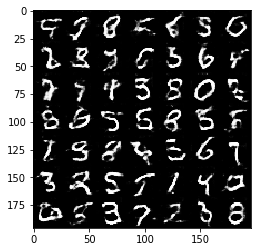

Epoch 1/2... Discriminator Loss: 1.8486... Generator Loss: 0.2657
Epoch 1/2... Discriminator Loss: 1.5731... Generator Loss: 0.4350
Epoch 1/2... Discriminator Loss: 1.5528... Generator Loss: 0.5539
Epoch 1/2... Discriminator Loss: 1.6643... Generator Loss: 0.3696
Epoch 1/2... Discriminator Loss: 1.6552... Generator Loss: 0.4343
Epoch 1/2... Discriminator Loss: 1.7461... Generator Loss: 0.2760
Epoch 1/2... Discriminator Loss: 1.6287... Generator Loss: 0.5210
Epoch 1/2... Discriminator Loss: 1.5690... Generator Loss: 0.3768
Epoch 1/2... Discriminator Loss: 1.7546... Generator Loss: 0.4090
Epoch 1/2... Discriminator Loss: 1.7253... Generator Loss: 0.4309


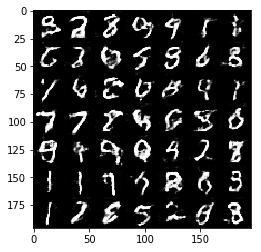

Epoch 1/2... Discriminator Loss: 1.4043... Generator Loss: 0.6007
Epoch 1/2... Discriminator Loss: 1.6647... Generator Loss: 0.3826
Epoch 1/2... Discriminator Loss: 1.9886... Generator Loss: 0.2970
Epoch 1/2... Discriminator Loss: 1.6043... Generator Loss: 0.5448
Epoch 1/2... Discriminator Loss: 1.4464... Generator Loss: 0.8483
Epoch 1/2... Discriminator Loss: 1.4095... Generator Loss: 0.5349
Epoch 1/2... Discriminator Loss: 1.6870... Generator Loss: 0.4030
Epoch 1/2... Discriminator Loss: 1.5745... Generator Loss: 0.3646
Epoch 1/2... Discriminator Loss: 1.8639... Generator Loss: 0.2584
Epoch 1/2... Discriminator Loss: 1.6754... Generator Loss: 0.3384


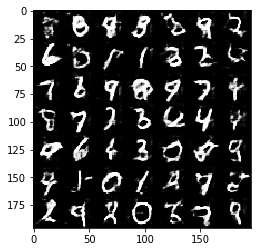

Epoch 1/2... Discriminator Loss: 1.9250... Generator Loss: 0.3208
Epoch 1/2... Discriminator Loss: 1.7282... Generator Loss: 0.4545
Epoch 1/2... Discriminator Loss: 1.5280... Generator Loss: 0.3878
Epoch 1/2... Discriminator Loss: 1.6470... Generator Loss: 0.2714
Epoch 1/2... Discriminator Loss: 1.6790... Generator Loss: 0.6703
Epoch 1/2... Discriminator Loss: 1.7518... Generator Loss: 0.3154
Epoch 1/2... Discriminator Loss: 1.8559... Generator Loss: 0.3447
Epoch 1/2... Discriminator Loss: 1.7484... Generator Loss: 0.4061
Epoch 1/2... Discriminator Loss: 1.5633... Generator Loss: 0.6111
Epoch 1/2... Discriminator Loss: 2.3575... Generator Loss: 0.1280


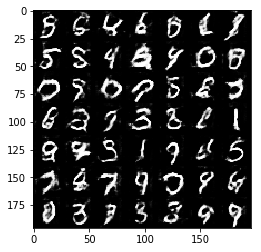

Epoch 1/2... Discriminator Loss: 1.7921... Generator Loss: 0.3324
Epoch 1/2... Discriminator Loss: 1.7635... Generator Loss: 0.5262
Epoch 1/2... Discriminator Loss: 1.8540... Generator Loss: 0.2617
Epoch 1/2... Discriminator Loss: 1.6180... Generator Loss: 0.3180
Epoch 1/2... Discriminator Loss: 1.4870... Generator Loss: 0.4722
Epoch 1/2... Discriminator Loss: 1.7036... Generator Loss: 0.5109
Epoch 1/2... Discriminator Loss: 1.7356... Generator Loss: 0.3054
Epoch 1/2... Discriminator Loss: 1.7065... Generator Loss: 0.3642
Epoch 1/2... Discriminator Loss: 1.5635... Generator Loss: 0.5073
Epoch 1/2... Discriminator Loss: 1.6434... Generator Loss: 0.3064


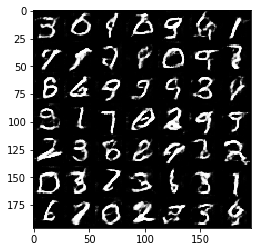

Epoch 1/2... Discriminator Loss: 1.6585... Generator Loss: 0.3824
Epoch 1/2... Discriminator Loss: 1.7212... Generator Loss: 0.3575
Epoch 1/2... Discriminator Loss: 1.9200... Generator Loss: 0.2080
Epoch 1/2... Discriminator Loss: 1.4047... Generator Loss: 0.6734
Epoch 1/2... Discriminator Loss: 1.6706... Generator Loss: 0.4062
Epoch 1/2... Discriminator Loss: 1.4416... Generator Loss: 0.4769
Epoch 1/2... Discriminator Loss: 1.7662... Generator Loss: 0.2597
Epoch 1/2... Discriminator Loss: 1.5297... Generator Loss: 0.5534
Epoch 1/2... Discriminator Loss: 1.6449... Generator Loss: 0.4508
Epoch 1/2... Discriminator Loss: 1.6862... Generator Loss: 0.4577


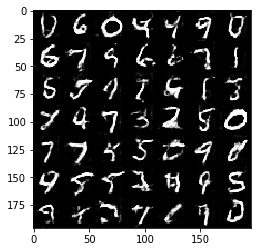

Epoch 1/2... Discriminator Loss: 1.6724... Generator Loss: 0.3004
Epoch 1/2... Discriminator Loss: 1.4325... Generator Loss: 0.5230
Epoch 1/2... Discriminator Loss: 1.5717... Generator Loss: 0.4244
Epoch 1/2... Discriminator Loss: 1.8950... Generator Loss: 0.2550
Epoch 1/2... Discriminator Loss: 1.6903... Generator Loss: 0.2975
Epoch 1/2... Discriminator Loss: 1.3809... Generator Loss: 0.5596
Epoch 1/2... Discriminator Loss: 1.8090... Generator Loss: 0.2956
Epoch 1/2... Discriminator Loss: 1.7560... Generator Loss: 0.3169
Epoch 1/2... Discriminator Loss: 1.3801... Generator Loss: 0.5483
Epoch 1/2... Discriminator Loss: 1.5105... Generator Loss: 0.4194


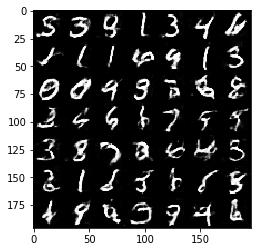

Epoch 1/2... Discriminator Loss: 1.4424... Generator Loss: 0.5080
Epoch 1/2... Discriminator Loss: 1.5072... Generator Loss: 0.3776
Epoch 1/2... Discriminator Loss: 1.6649... Generator Loss: 0.3722
Epoch 1/2... Discriminator Loss: 1.4381... Generator Loss: 0.5850
Epoch 1/2... Discriminator Loss: 1.6068... Generator Loss: 0.3508
Epoch 1/2... Discriminator Loss: 1.4640... Generator Loss: 0.4324
Epoch 1/2... Discriminator Loss: 1.1793... Generator Loss: 0.6594
Epoch 1/2... Discriminator Loss: 1.8415... Generator Loss: 0.2483
Epoch 1/2... Discriminator Loss: 1.5021... Generator Loss: 0.4250
Epoch 1/2... Discriminator Loss: 1.8762... Generator Loss: 0.2238


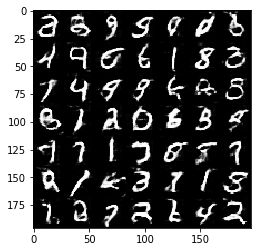

Epoch 1/2... Discriminator Loss: 1.5817... Generator Loss: 0.3307
Epoch 1/2... Discriminator Loss: 1.4405... Generator Loss: 0.4564
Epoch 1/2... Discriminator Loss: 1.9244... Generator Loss: 0.2278
Epoch 1/2... Discriminator Loss: 1.6033... Generator Loss: 0.3981
Epoch 1/2... Discriminator Loss: 1.6791... Generator Loss: 0.2773
Epoch 1/2... Discriminator Loss: 1.2841... Generator Loss: 0.5498
Epoch 1/2... Discriminator Loss: 1.4869... Generator Loss: 0.4848
Epoch 1/2... Discriminator Loss: 1.6861... Generator Loss: 0.2807
Epoch 1/2... Discriminator Loss: 1.5672... Generator Loss: 0.3378
Epoch 1/2... Discriminator Loss: 1.7226... Generator Loss: 0.5504


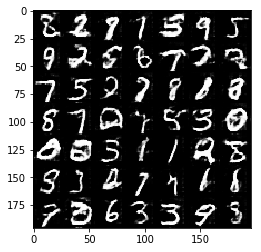

Epoch 1/2... Discriminator Loss: 1.3930... Generator Loss: 0.3937
Epoch 1/2... Discriminator Loss: 1.7418... Generator Loss: 0.2534
Epoch 1/2... Discriminator Loss: 1.3348... Generator Loss: 0.6478
Epoch 1/2... Discriminator Loss: 1.2664... Generator Loss: 0.5825
Epoch 1/2... Discriminator Loss: 1.4393... Generator Loss: 0.6394
Epoch 1/2... Discriminator Loss: 1.7363... Generator Loss: 0.3577
Epoch 1/2... Discriminator Loss: 1.6179... Generator Loss: 0.4084
Epoch 1/2... Discriminator Loss: 1.5692... Generator Loss: 0.3961
Epoch 1/2... Discriminator Loss: 1.5487... Generator Loss: 0.4756
Epoch 1/2... Discriminator Loss: 1.6206... Generator Loss: 0.3197


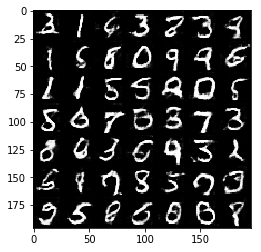

Epoch 1/2... Discriminator Loss: 1.6483... Generator Loss: 0.5398
Epoch 1/2... Discriminator Loss: 1.2363... Generator Loss: 0.6170
Epoch 1/2... Discriminator Loss: 1.6514... Generator Loss: 0.3850
Epoch 1/2... Discriminator Loss: 1.5642... Generator Loss: 0.5744
Epoch 1/2... Discriminator Loss: 1.6709... Generator Loss: 0.2952
Epoch 1/2... Discriminator Loss: 1.6806... Generator Loss: 0.2941
Epoch 1/2... Discriminator Loss: 1.6154... Generator Loss: 0.3289
Epoch 1/2... Discriminator Loss: 1.8267... Generator Loss: 0.3028
Epoch 1/2... Discriminator Loss: 1.5160... Generator Loss: 0.4778
Epoch 1/2... Discriminator Loss: 1.5110... Generator Loss: 0.5432


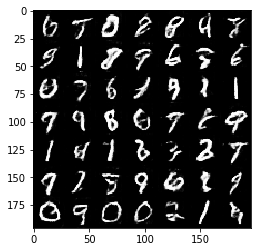

Epoch 1/2... Discriminator Loss: 1.5818... Generator Loss: 0.3243
Epoch 1/2... Discriminator Loss: 1.3991... Generator Loss: 0.6104
Epoch 1/2... Discriminator Loss: 1.6079... Generator Loss: 0.3678
Epoch 1/2... Discriminator Loss: 1.5421... Generator Loss: 0.4064
Epoch 1/2... Discriminator Loss: 1.6446... Generator Loss: 0.3770
Epoch 1/2... Discriminator Loss: 1.4755... Generator Loss: 0.4556
Epoch 1/2... Discriminator Loss: 1.0978... Generator Loss: 0.7508
Epoch 1/2... Discriminator Loss: 1.5612... Generator Loss: 0.4005
Epoch 1/2... Discriminator Loss: 1.7696... Generator Loss: 0.3343
Epoch 1/2... Discriminator Loss: 1.5168... Generator Loss: 0.4368


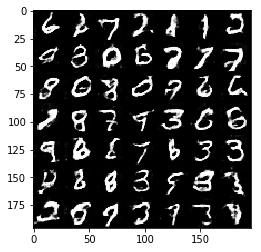

Epoch 1/2... Discriminator Loss: 1.4180... Generator Loss: 0.4849
Epoch 1/2... Discriminator Loss: 1.6863... Generator Loss: 0.3239
Epoch 1/2... Discriminator Loss: 1.2091... Generator Loss: 0.7928
Epoch 1/2... Discriminator Loss: 1.2682... Generator Loss: 0.5337
Epoch 1/2... Discriminator Loss: 1.3945... Generator Loss: 0.6058
Epoch 1/2... Discriminator Loss: 1.6489... Generator Loss: 0.4054
Epoch 1/2... Discriminator Loss: 1.2973... Generator Loss: 0.4533
Epoch 1/2... Discriminator Loss: 2.0677... Generator Loss: 0.1712
Epoch 1/2... Discriminator Loss: 1.5262... Generator Loss: 0.3918
Epoch 1/2... Discriminator Loss: 1.5926... Generator Loss: 0.3187


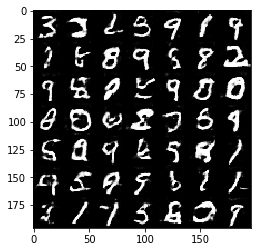

Epoch 1/2... Discriminator Loss: 1.3866... Generator Loss: 0.4688
Epoch 1/2... Discriminator Loss: 1.3633... Generator Loss: 0.4727
Epoch 1/2... Discriminator Loss: 1.4520... Generator Loss: 0.4655
Epoch 1/2... Discriminator Loss: 1.5339... Generator Loss: 0.3969
Epoch 1/2... Discriminator Loss: 1.2458... Generator Loss: 0.7257
Epoch 1/2... Discriminator Loss: 1.2982... Generator Loss: 0.5522
Epoch 1/2... Discriminator Loss: 1.4354... Generator Loss: 0.5660
Epoch 1/2... Discriminator Loss: 1.5641... Generator Loss: 0.6138
Epoch 1/2... Discriminator Loss: 1.5040... Generator Loss: 0.4672
Epoch 1/2... Discriminator Loss: 1.3326... Generator Loss: 0.5039


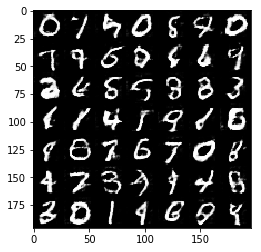

Epoch 1/2... Discriminator Loss: 1.4310... Generator Loss: 0.3878
Epoch 1/2... Discriminator Loss: 1.1606... Generator Loss: 0.8239
Epoch 1/2... Discriminator Loss: 1.6743... Generator Loss: 0.4278
Epoch 1/2... Discriminator Loss: 1.6411... Generator Loss: 0.2917
Epoch 1/2... Discriminator Loss: 1.5301... Generator Loss: 0.3966
Epoch 1/2... Discriminator Loss: 1.6785... Generator Loss: 0.3116
Epoch 1/2... Discriminator Loss: 1.3216... Generator Loss: 0.7803
Epoch 1/2... Discriminator Loss: 1.6982... Generator Loss: 0.2765
Epoch 1/2... Discriminator Loss: 1.5249... Generator Loss: 0.5332
Epoch 1/2... Discriminator Loss: 1.2579... Generator Loss: 0.6210


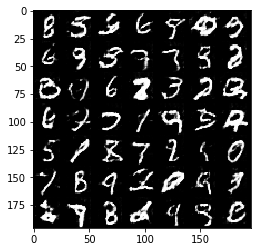

Epoch 1/2... Discriminator Loss: 1.5268... Generator Loss: 0.3348
Epoch 1/2... Discriminator Loss: 1.3983... Generator Loss: 0.5723
Epoch 1/2... Discriminator Loss: 1.1586... Generator Loss: 0.7606
Epoch 1/2... Discriminator Loss: 1.5913... Generator Loss: 0.3021
Epoch 1/2... Discriminator Loss: 1.3445... Generator Loss: 0.4619
Epoch 1/2... Discriminator Loss: 1.4621... Generator Loss: 0.3561
Epoch 1/2... Discriminator Loss: 1.3370... Generator Loss: 0.6914
Epoch 1/2... Discriminator Loss: 1.6866... Generator Loss: 0.3405
Epoch 1/2... Discriminator Loss: 1.5946... Generator Loss: 0.3622
Epoch 1/2... Discriminator Loss: 1.5199... Generator Loss: 0.3847


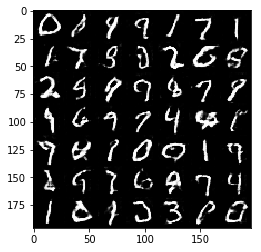

Epoch 1/2... Discriminator Loss: 1.8728... Generator Loss: 0.2248
Epoch 1/2... Discriminator Loss: 1.6378... Generator Loss: 0.2882
Epoch 1/2... Discriminator Loss: 1.1536... Generator Loss: 0.8525
Epoch 1/2... Discriminator Loss: 1.2586... Generator Loss: 0.5558
Epoch 1/2... Discriminator Loss: 1.7943... Generator Loss: 0.2309
Epoch 1/2... Discriminator Loss: 1.6627... Generator Loss: 0.3211
Epoch 1/2... Discriminator Loss: 1.9556... Generator Loss: 0.7952
Epoch 1/2... Discriminator Loss: 1.2928... Generator Loss: 0.6083
Epoch 1/2... Discriminator Loss: 1.4578... Generator Loss: 0.3721
Epoch 1/2... Discriminator Loss: 1.4169... Generator Loss: 0.5142


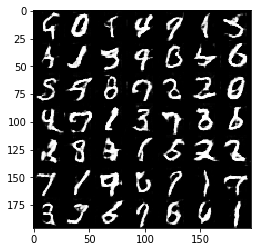

Epoch 1/2... Discriminator Loss: 1.4697... Generator Loss: 0.5709
Epoch 1/2... Discriminator Loss: 1.3577... Generator Loss: 0.5417
Epoch 1/2... Discriminator Loss: 1.3545... Generator Loss: 0.4015
Epoch 1/2... Discriminator Loss: 1.6240... Generator Loss: 0.3488
Epoch 1/2... Discriminator Loss: 1.5963... Generator Loss: 0.5884
Epoch 1/2... Discriminator Loss: 1.7376... Generator Loss: 0.2956
Epoch 1/2... Discriminator Loss: 1.9104... Generator Loss: 0.3177
Epoch 1/2... Discriminator Loss: 1.6444... Generator Loss: 0.3347
Epoch 1/2... Discriminator Loss: 1.2675... Generator Loss: 0.6325
Epoch 1/2... Discriminator Loss: 1.8403... Generator Loss: 0.2300


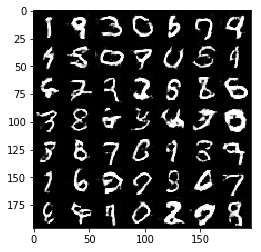

Epoch 1/2... Discriminator Loss: 1.1824... Generator Loss: 0.7526
Epoch 1/2... Discriminator Loss: 1.3853... Generator Loss: 0.4277
Epoch 1/2... Discriminator Loss: 1.1959... Generator Loss: 0.5589
Epoch 1/2... Discriminator Loss: 1.5016... Generator Loss: 0.6226
Epoch 1/2... Discriminator Loss: 1.2516... Generator Loss: 0.5242
Epoch 1/2... Discriminator Loss: 1.5075... Generator Loss: 0.4558
Epoch 1/2... Discriminator Loss: 1.1027... Generator Loss: 0.8068
Epoch 1/2... Discriminator Loss: 1.3327... Generator Loss: 0.6101
Epoch 1/2... Discriminator Loss: 1.2948... Generator Loss: 0.4579
Epoch 1/2... Discriminator Loss: 1.7918... Generator Loss: 0.2818


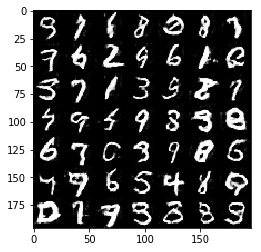

Epoch 1/2... Discriminator Loss: 1.8623... Generator Loss: 0.2342
Epoch 1/2... Discriminator Loss: 1.0620... Generator Loss: 0.7225
Epoch 1/2... Discriminator Loss: 1.4164... Generator Loss: 0.7479
Epoch 1/2... Discriminator Loss: 1.6601... Generator Loss: 0.8238
Epoch 1/2... Discriminator Loss: 1.3386... Generator Loss: 0.4611
Epoch 1/2... Discriminator Loss: 1.2719... Generator Loss: 0.6108
Epoch 1/2... Discriminator Loss: 1.3389... Generator Loss: 0.4615
Epoch 1/2... Discriminator Loss: 1.3474... Generator Loss: 0.5222
Epoch 1/2... Discriminator Loss: 1.3807... Generator Loss: 0.4795
Epoch 1/2... Discriminator Loss: 1.0829... Generator Loss: 0.7885


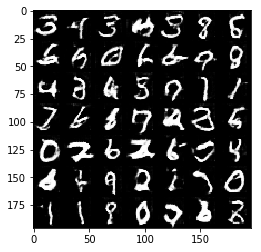

Epoch 1/2... Discriminator Loss: 0.9880... Generator Loss: 0.6787
Epoch 1/2... Discriminator Loss: 1.2022... Generator Loss: 0.8835
Epoch 1/2... Discriminator Loss: 1.2052... Generator Loss: 0.5502
Epoch 1/2... Discriminator Loss: 1.2084... Generator Loss: 0.6465
Epoch 1/2... Discriminator Loss: 1.4374... Generator Loss: 0.4135
Epoch 1/2... Discriminator Loss: 1.7312... Generator Loss: 0.2428
Epoch 1/2... Discriminator Loss: 1.6332... Generator Loss: 0.4318
Epoch 1/2... Discriminator Loss: 1.1548... Generator Loss: 0.6324
Epoch 1/2... Discriminator Loss: 1.4730... Generator Loss: 0.3756
Epoch 1/2... Discriminator Loss: 1.8907... Generator Loss: 0.2529


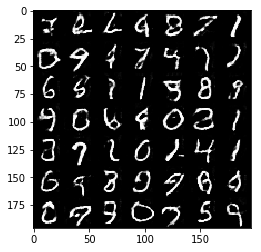

Epoch 1/2... Discriminator Loss: 1.8549... Generator Loss: 0.2494
Epoch 1/2... Discriminator Loss: 1.4635... Generator Loss: 0.3931
Epoch 1/2... Discriminator Loss: 1.1867... Generator Loss: 0.5495
Epoch 1/2... Discriminator Loss: 1.2068... Generator Loss: 0.5310
Epoch 1/2... Discriminator Loss: 1.1279... Generator Loss: 0.6091
Epoch 1/2... Discriminator Loss: 1.6835... Generator Loss: 0.3494
Epoch 1/2... Discriminator Loss: 1.4619... Generator Loss: 0.3954
Epoch 1/2... Discriminator Loss: 1.5450... Generator Loss: 0.4128
Epoch 1/2... Discriminator Loss: 1.9295... Generator Loss: 0.2557
Epoch 1/2... Discriminator Loss: 2.4381... Generator Loss: 0.1161


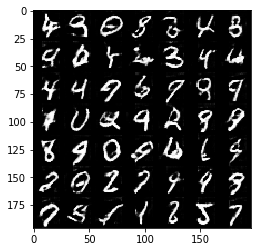

Epoch 1/2... Discriminator Loss: 1.2419... Generator Loss: 0.5069
Epoch 1/2... Discriminator Loss: 1.0827... Generator Loss: 0.5566
Epoch 1/2... Discriminator Loss: 1.7640... Generator Loss: 0.2366
Epoch 1/2... Discriminator Loss: 1.0824... Generator Loss: 1.2479
Epoch 1/2... Discriminator Loss: 1.3832... Generator Loss: 0.4050
Epoch 1/2... Discriminator Loss: 1.2584... Generator Loss: 0.4890
Epoch 1/2... Discriminator Loss: 0.9656... Generator Loss: 0.8584
Epoch 1/2... Discriminator Loss: 1.6822... Generator Loss: 0.2652
Epoch 1/2... Discriminator Loss: 0.8159... Generator Loss: 0.8312
Epoch 1/2... Discriminator Loss: 1.5318... Generator Loss: 0.3973


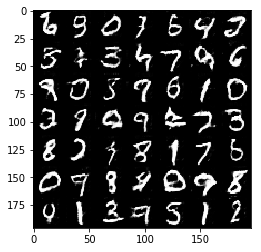

Epoch 1/2... Discriminator Loss: 1.0523... Generator Loss: 0.7277
Epoch 1/2... Discriminator Loss: 1.2503... Generator Loss: 0.6737
Epoch 1/2... Discriminator Loss: 1.4710... Generator Loss: 0.4413
Epoch 1/2... Discriminator Loss: 0.9735... Generator Loss: 0.7427
Epoch 1/2... Discriminator Loss: 1.3657... Generator Loss: 0.5292
Epoch 1/2... Discriminator Loss: 1.0510... Generator Loss: 0.6496
Epoch 1/2... Discriminator Loss: 1.4829... Generator Loss: 0.3788
Epoch 1/2... Discriminator Loss: 1.0883... Generator Loss: 0.6903
Epoch 1/2... Discriminator Loss: 1.6210... Generator Loss: 0.3709
Epoch 1/2... Discriminator Loss: 1.7962... Generator Loss: 0.2328


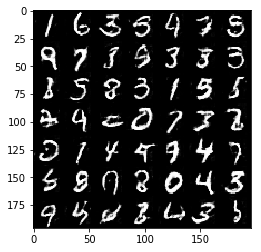

Epoch 1/2... Discriminator Loss: 1.0985... Generator Loss: 0.7864
Epoch 1/2... Discriminator Loss: 1.4882... Generator Loss: 0.3363
Epoch 1/2... Discriminator Loss: 2.2050... Generator Loss: 0.2004
Epoch 1/2... Discriminator Loss: 1.5026... Generator Loss: 0.4416
Epoch 1/2... Discriminator Loss: 1.3938... Generator Loss: 0.5830
Epoch 1/2... Discriminator Loss: 1.0599... Generator Loss: 0.9235
Epoch 1/2... Discriminator Loss: 1.8627... Generator Loss: 0.2593
Epoch 1/2... Discriminator Loss: 1.6696... Generator Loss: 0.3158
Epoch 1/2... Discriminator Loss: 1.2645... Generator Loss: 0.5934
Epoch 1/2... Discriminator Loss: 0.9499... Generator Loss: 0.7042


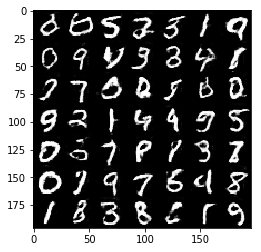

Epoch 1/2... Discriminator Loss: 1.6150... Generator Loss: 0.4618
Epoch 1/2... Discriminator Loss: 1.1274... Generator Loss: 0.6128
Epoch 1/2... Discriminator Loss: 1.0376... Generator Loss: 1.2330
Epoch 1/2... Discriminator Loss: 1.8985... Generator Loss: 0.2361
Epoch 1/2... Discriminator Loss: 1.3248... Generator Loss: 0.4628
Epoch 2/2... Discriminator Loss: 0.8755... Generator Loss: 1.0898
Epoch 2/2... Discriminator Loss: 1.2110... Generator Loss: 0.4962
Epoch 2/2... Discriminator Loss: 1.4916... Generator Loss: 0.3485
Epoch 2/2... Discriminator Loss: 1.3451... Generator Loss: 0.4642
Epoch 2/2... Discriminator Loss: 1.3451... Generator Loss: 0.4304


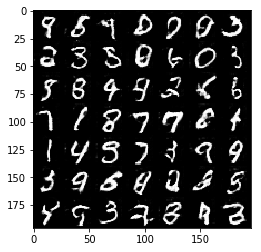

Epoch 2/2... Discriminator Loss: 1.2119... Generator Loss: 0.9149
Epoch 2/2... Discriminator Loss: 1.1734... Generator Loss: 0.7994
Epoch 2/2... Discriminator Loss: 1.3194... Generator Loss: 0.4044
Epoch 2/2... Discriminator Loss: 1.5543... Generator Loss: 0.3182
Epoch 2/2... Discriminator Loss: 1.8407... Generator Loss: 0.2171
Epoch 2/2... Discriminator Loss: 1.8762... Generator Loss: 0.1998
Epoch 2/2... Discriminator Loss: 1.2330... Generator Loss: 0.4928
Epoch 2/2... Discriminator Loss: 0.8864... Generator Loss: 0.7665
Epoch 2/2... Discriminator Loss: 1.3223... Generator Loss: 0.5905
Epoch 2/2... Discriminator Loss: 1.2856... Generator Loss: 0.5161


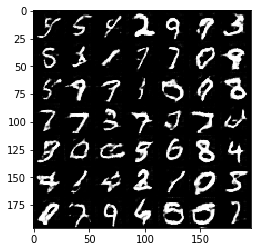

Epoch 2/2... Discriminator Loss: 1.4625... Generator Loss: 0.3221
Epoch 2/2... Discriminator Loss: 1.4193... Generator Loss: 0.4011
Epoch 2/2... Discriminator Loss: 0.7947... Generator Loss: 0.9314
Epoch 2/2... Discriminator Loss: 1.1551... Generator Loss: 0.5196
Epoch 2/2... Discriminator Loss: 1.8486... Generator Loss: 0.2523
Epoch 2/2... Discriminator Loss: 1.4827... Generator Loss: 0.3897
Epoch 2/2... Discriminator Loss: 1.7481... Generator Loss: 0.2446
Epoch 2/2... Discriminator Loss: 1.2144... Generator Loss: 0.5179
Epoch 2/2... Discriminator Loss: 1.2252... Generator Loss: 0.4771
Epoch 2/2... Discriminator Loss: 1.6382... Generator Loss: 0.2861


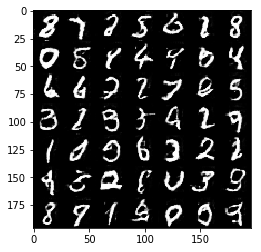

Epoch 2/2... Discriminator Loss: 1.5217... Generator Loss: 0.3460
Epoch 2/2... Discriminator Loss: 1.5802... Generator Loss: 0.3097
Epoch 2/2... Discriminator Loss: 0.8968... Generator Loss: 1.0065
Epoch 2/2... Discriminator Loss: 1.3038... Generator Loss: 0.4505
Epoch 2/2... Discriminator Loss: 0.7624... Generator Loss: 0.9383
Epoch 2/2... Discriminator Loss: 0.8701... Generator Loss: 0.7487
Epoch 2/2... Discriminator Loss: 1.0925... Generator Loss: 0.6398
Epoch 2/2... Discriminator Loss: 0.8859... Generator Loss: 0.8435
Epoch 2/2... Discriminator Loss: 1.9755... Generator Loss: 0.1855
Epoch 2/2... Discriminator Loss: 2.0562... Generator Loss: 0.1838


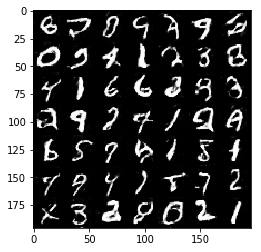

Epoch 2/2... Discriminator Loss: 1.5022... Generator Loss: 0.4377
Epoch 2/2... Discriminator Loss: 1.5886... Generator Loss: 0.3166
Epoch 2/2... Discriminator Loss: 1.2720... Generator Loss: 0.4713
Epoch 2/2... Discriminator Loss: 1.1273... Generator Loss: 0.7057
Epoch 2/2... Discriminator Loss: 1.4292... Generator Loss: 0.3694
Epoch 2/2... Discriminator Loss: 1.3475... Generator Loss: 0.4122
Epoch 2/2... Discriminator Loss: 1.5284... Generator Loss: 0.3037
Epoch 2/2... Discriminator Loss: 1.5780... Generator Loss: 0.3263
Epoch 2/2... Discriminator Loss: 1.9753... Generator Loss: 0.2219
Epoch 2/2... Discriminator Loss: 1.4343... Generator Loss: 0.4478


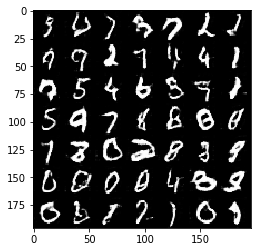

Epoch 2/2... Discriminator Loss: 0.9221... Generator Loss: 0.7103
Epoch 2/2... Discriminator Loss: 0.8718... Generator Loss: 0.7472
Epoch 2/2... Discriminator Loss: 1.3210... Generator Loss: 0.5072
Epoch 2/2... Discriminator Loss: 1.5609... Generator Loss: 0.3281
Epoch 2/2... Discriminator Loss: 1.4128... Generator Loss: 0.3873
Epoch 2/2... Discriminator Loss: 1.0008... Generator Loss: 0.8112
Epoch 2/2... Discriminator Loss: 1.1407... Generator Loss: 0.6321
Epoch 2/2... Discriminator Loss: 0.9179... Generator Loss: 0.7943
Epoch 2/2... Discriminator Loss: 1.2362... Generator Loss: 0.6196
Epoch 2/2... Discriminator Loss: 0.8471... Generator Loss: 0.7606


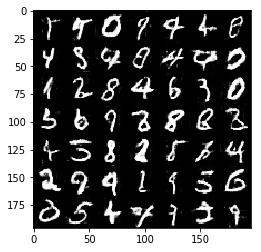

Epoch 2/2... Discriminator Loss: 1.3430... Generator Loss: 0.4674
Epoch 2/2... Discriminator Loss: 1.4340... Generator Loss: 0.3950
Epoch 2/2... Discriminator Loss: 1.4995... Generator Loss: 0.4154
Epoch 2/2... Discriminator Loss: 1.9532... Generator Loss: 0.4981
Epoch 2/2... Discriminator Loss: 0.9257... Generator Loss: 0.8378
Epoch 2/2... Discriminator Loss: 1.2185... Generator Loss: 0.7745
Epoch 2/2... Discriminator Loss: 1.4205... Generator Loss: 0.4448
Epoch 2/2... Discriminator Loss: 1.2117... Generator Loss: 0.5528
Epoch 2/2... Discriminator Loss: 1.8140... Generator Loss: 0.2629
Epoch 2/2... Discriminator Loss: 1.5388... Generator Loss: 0.3066


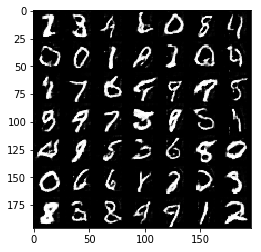

Epoch 2/2... Discriminator Loss: 2.1201... Generator Loss: 0.1687
Epoch 2/2... Discriminator Loss: 1.4184... Generator Loss: 0.4582
Epoch 2/2... Discriminator Loss: 1.3843... Generator Loss: 0.5217
Epoch 2/2... Discriminator Loss: 1.6001... Generator Loss: 0.6845
Epoch 2/2... Discriminator Loss: 1.7256... Generator Loss: 0.2456
Epoch 2/2... Discriminator Loss: 2.5570... Generator Loss: 0.1083
Epoch 2/2... Discriminator Loss: 1.6445... Generator Loss: 0.2958
Epoch 2/2... Discriminator Loss: 1.3344... Generator Loss: 0.4463
Epoch 2/2... Discriminator Loss: 1.3002... Generator Loss: 0.6023
Epoch 2/2... Discriminator Loss: 1.3180... Generator Loss: 0.4727


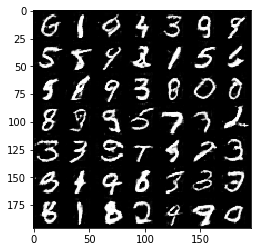

Epoch 2/2... Discriminator Loss: 3.1038... Generator Loss: 0.0801
Epoch 2/2... Discriminator Loss: 0.9186... Generator Loss: 0.7549
Epoch 2/2... Discriminator Loss: 1.3166... Generator Loss: 0.8200
Epoch 2/2... Discriminator Loss: 1.8087... Generator Loss: 0.2557
Epoch 2/2... Discriminator Loss: 1.4721... Generator Loss: 0.4404
Epoch 2/2... Discriminator Loss: 1.1725... Generator Loss: 0.5287
Epoch 2/2... Discriminator Loss: 0.9815... Generator Loss: 0.8856
Epoch 2/2... Discriminator Loss: 1.2326... Generator Loss: 0.5085
Epoch 2/2... Discriminator Loss: 1.2175... Generator Loss: 0.4182
Epoch 2/2... Discriminator Loss: 1.1414... Generator Loss: 0.6128


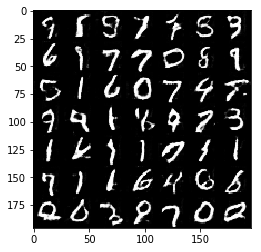

Epoch 2/2... Discriminator Loss: 0.9639... Generator Loss: 0.9305
Epoch 2/2... Discriminator Loss: 1.1767... Generator Loss: 0.5400
Epoch 2/2... Discriminator Loss: 1.4968... Generator Loss: 0.3868
Epoch 2/2... Discriminator Loss: 1.8602... Generator Loss: 0.2212
Epoch 2/2... Discriminator Loss: 1.1845... Generator Loss: 0.9154
Epoch 2/2... Discriminator Loss: 1.1733... Generator Loss: 0.5528
Epoch 2/2... Discriminator Loss: 0.8212... Generator Loss: 0.8864
Epoch 2/2... Discriminator Loss: 1.2952... Generator Loss: 0.4659
Epoch 2/2... Discriminator Loss: 1.0379... Generator Loss: 1.0241
Epoch 2/2... Discriminator Loss: 1.5470... Generator Loss: 0.3800


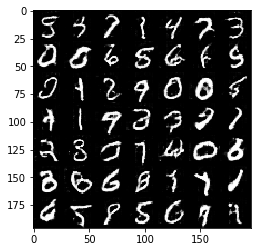

Epoch 2/2... Discriminator Loss: 1.9516... Generator Loss: 0.2129
Epoch 2/2... Discriminator Loss: 1.4978... Generator Loss: 0.6952
Epoch 2/2... Discriminator Loss: 1.4899... Generator Loss: 0.3254
Epoch 2/2... Discriminator Loss: 1.2671... Generator Loss: 0.5874
Epoch 2/2... Discriminator Loss: 1.2386... Generator Loss: 0.4734
Epoch 2/2... Discriminator Loss: 1.2773... Generator Loss: 0.4455
Epoch 2/2... Discriminator Loss: 1.0926... Generator Loss: 0.5845
Epoch 2/2... Discriminator Loss: 1.4510... Generator Loss: 0.3612
Epoch 2/2... Discriminator Loss: 1.2451... Generator Loss: 0.6113
Epoch 2/2... Discriminator Loss: 1.2775... Generator Loss: 0.4660


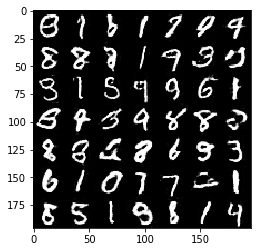

Epoch 2/2... Discriminator Loss: 0.8696... Generator Loss: 0.9091
Epoch 2/2... Discriminator Loss: 1.7072... Generator Loss: 0.2771
Epoch 2/2... Discriminator Loss: 1.2855... Generator Loss: 0.7525
Epoch 2/2... Discriminator Loss: 1.7191... Generator Loss: 0.2863
Epoch 2/2... Discriminator Loss: 1.8843... Generator Loss: 0.2152
Epoch 2/2... Discriminator Loss: 1.3437... Generator Loss: 0.3737
Epoch 2/2... Discriminator Loss: 1.1229... Generator Loss: 0.7063
Epoch 2/2... Discriminator Loss: 1.6195... Generator Loss: 0.3392
Epoch 2/2... Discriminator Loss: 0.9341... Generator Loss: 0.8567
Epoch 2/2... Discriminator Loss: 1.9370... Generator Loss: 0.2294


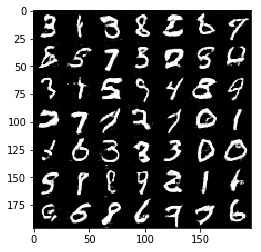

Epoch 2/2... Discriminator Loss: 1.6502... Generator Loss: 0.4523
Epoch 2/2... Discriminator Loss: 2.3347... Generator Loss: 0.1545
Epoch 2/2... Discriminator Loss: 1.1681... Generator Loss: 0.6572
Epoch 2/2... Discriminator Loss: 1.5573... Generator Loss: 0.2725
Epoch 2/2... Discriminator Loss: 1.1674... Generator Loss: 0.5844
Epoch 2/2... Discriminator Loss: 1.8853... Generator Loss: 0.2688
Epoch 2/2... Discriminator Loss: 1.0191... Generator Loss: 0.7127
Epoch 2/2... Discriminator Loss: 1.2585... Generator Loss: 0.5814
Epoch 2/2... Discriminator Loss: 1.4875... Generator Loss: 0.3725
Epoch 2/2... Discriminator Loss: 1.5519... Generator Loss: 0.3829


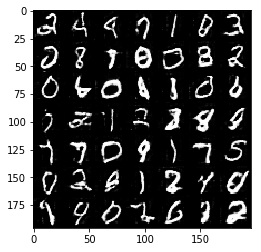

Epoch 2/2... Discriminator Loss: 1.5579... Generator Loss: 0.3323
Epoch 2/2... Discriminator Loss: 1.6721... Generator Loss: 0.3580
Epoch 2/2... Discriminator Loss: 3.0308... Generator Loss: 0.0629
Epoch 2/2... Discriminator Loss: 1.4283... Generator Loss: 0.3751
Epoch 2/2... Discriminator Loss: 1.1893... Generator Loss: 0.5940
Epoch 2/2... Discriminator Loss: 1.6509... Generator Loss: 0.2742
Epoch 2/2... Discriminator Loss: 1.2950... Generator Loss: 0.4988
Epoch 2/2... Discriminator Loss: 0.8920... Generator Loss: 0.9063
Epoch 2/2... Discriminator Loss: 1.0861... Generator Loss: 0.6528
Epoch 2/2... Discriminator Loss: 1.5710... Generator Loss: 0.5634


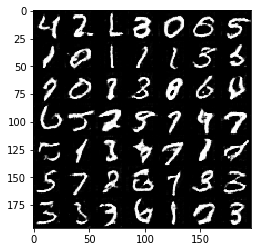

Epoch 2/2... Discriminator Loss: 1.1856... Generator Loss: 1.4515
Epoch 2/2... Discriminator Loss: 0.9652... Generator Loss: 0.8055
Epoch 2/2... Discriminator Loss: 1.5518... Generator Loss: 0.3301
Epoch 2/2... Discriminator Loss: 1.6881... Generator Loss: 0.3462
Epoch 2/2... Discriminator Loss: 1.0737... Generator Loss: 0.5356
Epoch 2/2... Discriminator Loss: 1.6871... Generator Loss: 0.3033
Epoch 2/2... Discriminator Loss: 1.3162... Generator Loss: 0.3908
Epoch 2/2... Discriminator Loss: 1.6137... Generator Loss: 0.3873
Epoch 2/2... Discriminator Loss: 1.4530... Generator Loss: 0.5367
Epoch 2/2... Discriminator Loss: 1.0640... Generator Loss: 0.7910


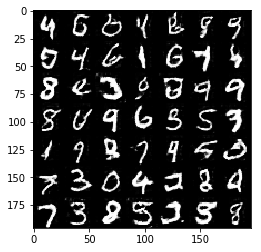

Epoch 2/2... Discriminator Loss: 0.8292... Generator Loss: 0.8018
Epoch 2/2... Discriminator Loss: 1.0933... Generator Loss: 0.9895
Epoch 2/2... Discriminator Loss: 1.9784... Generator Loss: 0.6802
Epoch 2/2... Discriminator Loss: 1.3702... Generator Loss: 0.3455
Epoch 2/2... Discriminator Loss: 1.0792... Generator Loss: 0.5951
Epoch 2/2... Discriminator Loss: 1.1306... Generator Loss: 0.4949
Epoch 2/2... Discriminator Loss: 1.3113... Generator Loss: 0.4994
Epoch 2/2... Discriminator Loss: 1.0205... Generator Loss: 1.1832
Epoch 2/2... Discriminator Loss: 0.8662... Generator Loss: 0.8945
Epoch 2/2... Discriminator Loss: 1.7692... Generator Loss: 0.3037


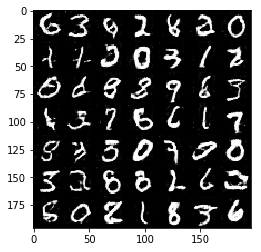

Epoch 2/2... Discriminator Loss: 1.7549... Generator Loss: 0.2672
Epoch 2/2... Discriminator Loss: 1.3646... Generator Loss: 0.4190
Epoch 2/2... Discriminator Loss: 1.6606... Generator Loss: 0.3030
Epoch 2/2... Discriminator Loss: 1.2332... Generator Loss: 0.5925
Epoch 2/2... Discriminator Loss: 1.9367... Generator Loss: 0.1976
Epoch 2/2... Discriminator Loss: 1.3173... Generator Loss: 0.7285
Epoch 2/2... Discriminator Loss: 1.0700... Generator Loss: 0.6447
Epoch 2/2... Discriminator Loss: 1.0749... Generator Loss: 0.5873
Epoch 2/2... Discriminator Loss: 1.2580... Generator Loss: 0.6928
Epoch 2/2... Discriminator Loss: 1.3515... Generator Loss: 0.4498


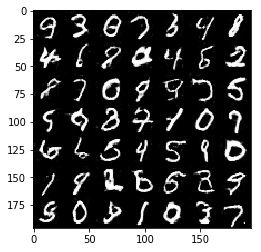

Epoch 2/2... Discriminator Loss: 1.3553... Generator Loss: 0.4457
Epoch 2/2... Discriminator Loss: 1.2765... Generator Loss: 0.4361
Epoch 2/2... Discriminator Loss: 1.3079... Generator Loss: 0.5076
Epoch 2/2... Discriminator Loss: 1.7277... Generator Loss: 0.2935
Epoch 2/2... Discriminator Loss: 1.1599... Generator Loss: 0.5398
Epoch 2/2... Discriminator Loss: 1.6803... Generator Loss: 0.2709
Epoch 2/2... Discriminator Loss: 2.7408... Generator Loss: 0.1013
Epoch 2/2... Discriminator Loss: 1.8447... Generator Loss: 0.2000
Epoch 2/2... Discriminator Loss: 1.2701... Generator Loss: 0.4800
Epoch 2/2... Discriminator Loss: 1.6873... Generator Loss: 0.3406


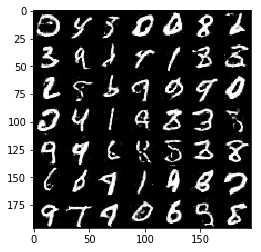

Epoch 2/2... Discriminator Loss: 0.9610... Generator Loss: 0.6935
Epoch 2/2... Discriminator Loss: 1.3091... Generator Loss: 0.4577
Epoch 2/2... Discriminator Loss: 1.3311... Generator Loss: 0.6977
Epoch 2/2... Discriminator Loss: 1.6439... Generator Loss: 0.3104
Epoch 2/2... Discriminator Loss: 1.1172... Generator Loss: 0.5714
Epoch 2/2... Discriminator Loss: 1.2024... Generator Loss: 0.6663
Epoch 2/2... Discriminator Loss: 1.3074... Generator Loss: 0.4189
Epoch 2/2... Discriminator Loss: 1.3396... Generator Loss: 0.4526
Epoch 2/2... Discriminator Loss: 1.7030... Generator Loss: 0.3350
Epoch 2/2... Discriminator Loss: 1.9209... Generator Loss: 0.2363


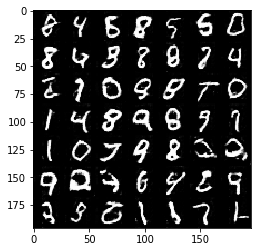

Epoch 2/2... Discriminator Loss: 1.6993... Generator Loss: 0.3755
Epoch 2/2... Discriminator Loss: 1.2217... Generator Loss: 0.6644
Epoch 2/2... Discriminator Loss: 1.3808... Generator Loss: 0.4558
Epoch 2/2... Discriminator Loss: 0.8894... Generator Loss: 0.7722
Epoch 2/2... Discriminator Loss: 1.6137... Generator Loss: 0.4053
Epoch 2/2... Discriminator Loss: 1.6302... Generator Loss: 0.3435
Epoch 2/2... Discriminator Loss: 1.2670... Generator Loss: 0.4163
Epoch 2/2... Discriminator Loss: 1.5531... Generator Loss: 0.2746
Epoch 2/2... Discriminator Loss: 2.2865... Generator Loss: 0.1799
Epoch 2/2... Discriminator Loss: 1.0134... Generator Loss: 0.6486


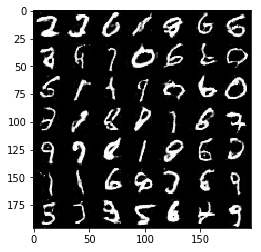

Epoch 2/2... Discriminator Loss: 1.1213... Generator Loss: 0.5317
Epoch 2/2... Discriminator Loss: 1.5497... Generator Loss: 0.3360
Epoch 2/2... Discriminator Loss: 2.5400... Generator Loss: 0.1117
Epoch 2/2... Discriminator Loss: 1.4329... Generator Loss: 0.5030
Epoch 2/2... Discriminator Loss: 2.1395... Generator Loss: 0.1590
Epoch 2/2... Discriminator Loss: 1.0275... Generator Loss: 0.6903
Epoch 2/2... Discriminator Loss: 1.2613... Generator Loss: 0.5063
Epoch 2/2... Discriminator Loss: 2.9478... Generator Loss: 0.0940
Epoch 2/2... Discriminator Loss: 1.5117... Generator Loss: 0.3400
Epoch 2/2... Discriminator Loss: 1.6879... Generator Loss: 0.3299


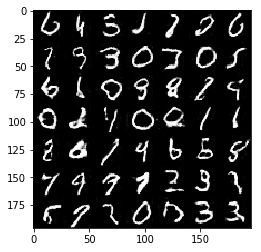

Epoch 2/2... Discriminator Loss: 1.5512... Generator Loss: 0.3137
Epoch 2/2... Discriminator Loss: 0.8887... Generator Loss: 0.9324
Epoch 2/2... Discriminator Loss: 0.8896... Generator Loss: 1.1161
Epoch 2/2... Discriminator Loss: 1.2833... Generator Loss: 0.5277
Epoch 2/2... Discriminator Loss: 1.3650... Generator Loss: 0.4806
Epoch 2/2... Discriminator Loss: 1.0191... Generator Loss: 0.6179
Epoch 2/2... Discriminator Loss: 1.2537... Generator Loss: 0.4435
Epoch 2/2... Discriminator Loss: 1.2862... Generator Loss: 0.5260
Epoch 2/2... Discriminator Loss: 1.3887... Generator Loss: 0.4947
Epoch 2/2... Discriminator Loss: 2.0155... Generator Loss: 0.3126


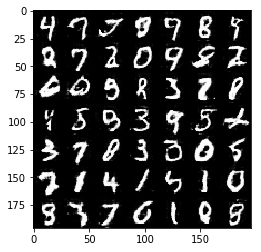

Epoch 2/2... Discriminator Loss: 0.7873... Generator Loss: 0.9611
Epoch 2/2... Discriminator Loss: 1.2796... Generator Loss: 0.4940
Epoch 2/2... Discriminator Loss: 1.5184... Generator Loss: 0.3825
Epoch 2/2... Discriminator Loss: 1.5312... Generator Loss: 0.3501
Epoch 2/2... Discriminator Loss: 1.5656... Generator Loss: 0.3514
Epoch 2/2... Discriminator Loss: 1.7250... Generator Loss: 0.3138
Epoch 2/2... Discriminator Loss: 1.6620... Generator Loss: 0.2994
Epoch 2/2... Discriminator Loss: 1.9858... Generator Loss: 0.2383
Epoch 2/2... Discriminator Loss: 1.4218... Generator Loss: 0.3911
Epoch 2/2... Discriminator Loss: 1.5568... Generator Loss: 0.3471


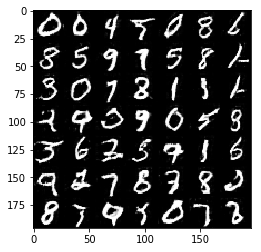

Epoch 2/2... Discriminator Loss: 1.9780... Generator Loss: 0.2059
Epoch 2/2... Discriminator Loss: 1.3345... Generator Loss: 0.4227
Epoch 2/2... Discriminator Loss: 1.5743... Generator Loss: 0.3012
Epoch 2/2... Discriminator Loss: 1.1159... Generator Loss: 0.5353
Epoch 2/2... Discriminator Loss: 1.3192... Generator Loss: 0.6099
Epoch 2/2... Discriminator Loss: 1.3024... Generator Loss: 0.4828
Epoch 2/2... Discriminator Loss: 1.6576... Generator Loss: 0.3061
Epoch 2/2... Discriminator Loss: 1.5646... Generator Loss: 0.3657
Epoch 2/2... Discriminator Loss: 1.1410... Generator Loss: 0.5943
Epoch 2/2... Discriminator Loss: 1.9399... Generator Loss: 0.2524


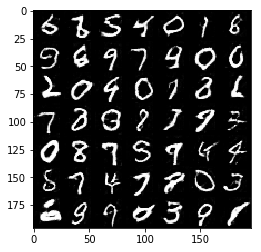

Epoch 2/2... Discriminator Loss: 0.8432... Generator Loss: 0.9983
Epoch 2/2... Discriminator Loss: 1.1834... Generator Loss: 0.7133
Epoch 2/2... Discriminator Loss: 1.9418... Generator Loss: 0.2813
Epoch 2/2... Discriminator Loss: 2.2019... Generator Loss: 0.1616
Epoch 2/2... Discriminator Loss: 1.3994... Generator Loss: 0.4164
Epoch 2/2... Discriminator Loss: 1.2568... Generator Loss: 0.4773
Epoch 2/2... Discriminator Loss: 1.0439... Generator Loss: 0.8300
Epoch 2/2... Discriminator Loss: 1.1571... Generator Loss: 0.9991
Epoch 2/2... Discriminator Loss: 1.6208... Generator Loss: 0.3461
Epoch 2/2... Discriminator Loss: 0.8764... Generator Loss: 0.9512


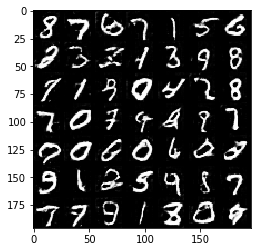

Epoch 2/2... Discriminator Loss: 1.7378... Generator Loss: 0.2360
Epoch 2/2... Discriminator Loss: 1.4572... Generator Loss: 0.3643
Epoch 2/2... Discriminator Loss: 1.6954... Generator Loss: 0.2794
Epoch 2/2... Discriminator Loss: 1.4879... Generator Loss: 0.3583
Epoch 2/2... Discriminator Loss: 1.6192... Generator Loss: 0.3225
Epoch 2/2... Discriminator Loss: 1.9251... Generator Loss: 0.2582
Epoch 2/2... Discriminator Loss: 1.7020... Generator Loss: 0.3088
Epoch 2/2... Discriminator Loss: 0.8054... Generator Loss: 0.7735
Epoch 2/2... Discriminator Loss: 1.4746... Generator Loss: 0.4023
Epoch 2/2... Discriminator Loss: 0.9766... Generator Loss: 0.7843


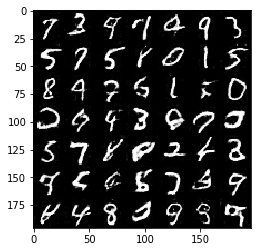

Epoch 2/2... Discriminator Loss: 0.9400... Generator Loss: 0.6272
Epoch 2/2... Discriminator Loss: 1.2851... Generator Loss: 0.5449
Epoch 2/2... Discriminator Loss: 1.5860... Generator Loss: 0.5413
Epoch 2/2... Discriminator Loss: 1.7413... Generator Loss: 0.2340
Epoch 2/2... Discriminator Loss: 1.3695... Generator Loss: 0.6504
Epoch 2/2... Discriminator Loss: 1.2807... Generator Loss: 0.4724
Epoch 2/2... Discriminator Loss: 1.5151... Generator Loss: 0.3288
Epoch 2/2... Discriminator Loss: 1.6381... Generator Loss: 0.2859
Epoch 2/2... Discriminator Loss: 0.9319... Generator Loss: 1.1328
Epoch 2/2... Discriminator Loss: 1.3530... Generator Loss: 0.5548


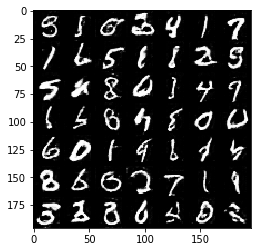

Epoch 2/2... Discriminator Loss: 1.4402... Generator Loss: 0.4443
Epoch 2/2... Discriminator Loss: 2.1385... Generator Loss: 0.2759
Epoch 2/2... Discriminator Loss: 1.3730... Generator Loss: 0.4121
Epoch 2/2... Discriminator Loss: 1.4054... Generator Loss: 0.4472
Epoch 2/2... Discriminator Loss: 1.4809... Generator Loss: 0.4152
Epoch 2/2... Discriminator Loss: 1.4208... Generator Loss: 0.3956
Epoch 2/2... Discriminator Loss: 1.9664... Generator Loss: 0.2015
Epoch 2/2... Discriminator Loss: 1.7306... Generator Loss: 0.3073
Epoch 2/2... Discriminator Loss: 1.3836... Generator Loss: 0.4906
Epoch 2/2... Discriminator Loss: 2.2387... Generator Loss: 0.1609


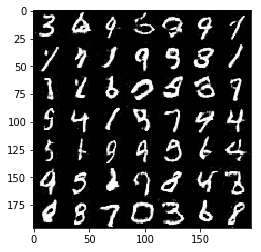

Epoch 2/2... Discriminator Loss: 1.2358... Generator Loss: 0.5001
Epoch 2/2... Discriminator Loss: 1.3864... Generator Loss: 0.3960
Epoch 2/2... Discriminator Loss: 1.7224... Generator Loss: 0.3668
Epoch 2/2... Discriminator Loss: 1.6173... Generator Loss: 0.3467
Epoch 2/2... Discriminator Loss: 1.4467... Generator Loss: 0.3893
Epoch 2/2... Discriminator Loss: 1.1670... Generator Loss: 0.5596
Epoch 2/2... Discriminator Loss: 1.3610... Generator Loss: 0.3763
Epoch 2/2... Discriminator Loss: 0.5414... Generator Loss: 1.2910
Epoch 2/2... Discriminator Loss: 1.1275... Generator Loss: 0.5579
Epoch 2/2... Discriminator Loss: 1.9374... Generator Loss: 0.2166


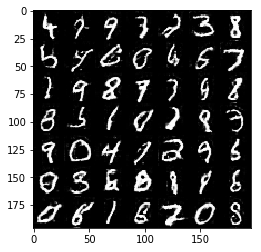

Epoch 2/2... Discriminator Loss: 1.1652... Generator Loss: 0.5139
Epoch 2/2... Discriminator Loss: 1.7870... Generator Loss: 0.3466
Epoch 2/2... Discriminator Loss: 1.3564... Generator Loss: 0.5529
Epoch 2/2... Discriminator Loss: 1.7828... Generator Loss: 0.2553
Epoch 2/2... Discriminator Loss: 1.2232... Generator Loss: 0.4446
Epoch 2/2... Discriminator Loss: 2.1484... Generator Loss: 0.1948
Epoch 2/2... Discriminator Loss: 1.3718... Generator Loss: 0.3907
Epoch 2/2... Discriminator Loss: 1.5648... Generator Loss: 0.3904
Epoch 2/2... Discriminator Loss: 1.0506... Generator Loss: 1.2155
Epoch 2/2... Discriminator Loss: 1.8431... Generator Loss: 1.4169


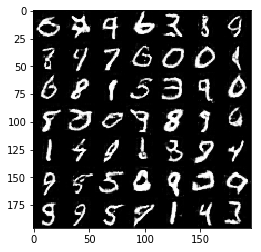

Epoch 2/2... Discriminator Loss: 1.8822... Generator Loss: 0.2592
Epoch 2/2... Discriminator Loss: 1.9539... Generator Loss: 0.2886
Epoch 2/2... Discriminator Loss: 1.5707... Generator Loss: 0.3040
Epoch 2/2... Discriminator Loss: 1.3208... Generator Loss: 0.4225
Epoch 2/2... Discriminator Loss: 1.5406... Generator Loss: 0.3417
Epoch 2/2... Discriminator Loss: 1.2961... Generator Loss: 0.4819
Epoch 2/2... Discriminator Loss: 1.7588... Generator Loss: 0.2761
Epoch 2/2... Discriminator Loss: 1.6028... Generator Loss: 0.3520
Epoch 2/2... Discriminator Loss: 1.1652... Generator Loss: 0.5102
Epoch 2/2... Discriminator Loss: 1.8187... Generator Loss: 0.2447


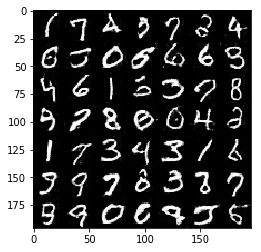

Epoch 2/2... Discriminator Loss: 1.6810... Generator Loss: 0.2795
Epoch 2/2... Discriminator Loss: 1.0700... Generator Loss: 0.6159
Epoch 2/2... Discriminator Loss: 1.0370... Generator Loss: 0.5755
Epoch 2/2... Discriminator Loss: 1.8316... Generator Loss: 0.2644
Epoch 2/2... Discriminator Loss: 1.6768... Generator Loss: 0.3497
Epoch 2/2... Discriminator Loss: 3.2489... Generator Loss: 0.0690
Epoch 2/2... Discriminator Loss: 1.7087... Generator Loss: 0.3209
Epoch 2/2... Discriminator Loss: 1.7903... Generator Loss: 0.2672
Epoch 2/2... Discriminator Loss: 1.1241... Generator Loss: 0.7668
Epoch 2/2... Discriminator Loss: 0.9324... Generator Loss: 0.8186


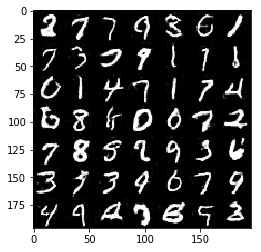

Epoch 2/2... Discriminator Loss: 1.7117... Generator Loss: 0.3052
Epoch 2/2... Discriminator Loss: 1.3433... Generator Loss: 0.5185
Epoch 2/2... Discriminator Loss: 1.5558... Generator Loss: 0.3386
Epoch 2/2... Discriminator Loss: 2.4831... Generator Loss: 0.1205
Epoch 2/2... Discriminator Loss: 1.2882... Generator Loss: 0.6646
Epoch 2/2... Discriminator Loss: 1.4472... Generator Loss: 0.4368
Epoch 2/2... Discriminator Loss: 1.6489... Generator Loss: 0.3190
Epoch 2/2... Discriminator Loss: 1.2144... Generator Loss: 0.6368
Epoch 2/2... Discriminator Loss: 1.5241... Generator Loss: 0.3386
Epoch 2/2... Discriminator Loss: 1.9816... Generator Loss: 0.1870


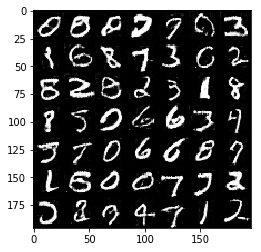

Epoch 2/2... Discriminator Loss: 1.3843... Generator Loss: 0.4434
Epoch 2/2... Discriminator Loss: 2.4109... Generator Loss: 0.1754
Epoch 2/2... Discriminator Loss: 1.6108... Generator Loss: 0.3463
Epoch 2/2... Discriminator Loss: 1.3896... Generator Loss: 0.4299
Epoch 2/2... Discriminator Loss: 2.1346... Generator Loss: 0.1969
Epoch 2/2... Discriminator Loss: 2.0909... Generator Loss: 0.2043
Epoch 2/2... Discriminator Loss: 1.2522... Generator Loss: 0.6409
Epoch 2/2... Discriminator Loss: 1.3320... Generator Loss: 0.4056
Epoch 2/2... Discriminator Loss: 1.1676... Generator Loss: 0.6099
Epoch 2/2... Discriminator Loss: 1.5853... Generator Loss: 0.3035


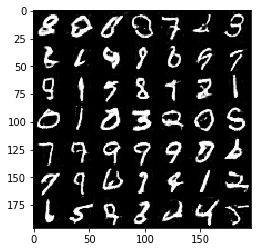

Epoch 2/2... Discriminator Loss: 1.8691... Generator Loss: 0.2118
Epoch 2/2... Discriminator Loss: 1.3207... Generator Loss: 0.4369
Epoch 2/2... Discriminator Loss: 2.0578... Generator Loss: 0.2298
Epoch 2/2... Discriminator Loss: 1.7835... Generator Loss: 0.2369
Epoch 2/2... Discriminator Loss: 2.0269... Generator Loss: 0.2238
Epoch 2/2... Discriminator Loss: 1.4879... Generator Loss: 0.3586
Epoch 2/2... Discriminator Loss: 1.1559... Generator Loss: 0.5748
Epoch 2/2... Discriminator Loss: 1.8069... Generator Loss: 0.2684
Epoch 2/2... Discriminator Loss: 1.4393... Generator Loss: 0.3631
Epoch 2/2... Discriminator Loss: 1.4334... Generator Loss: 0.3717


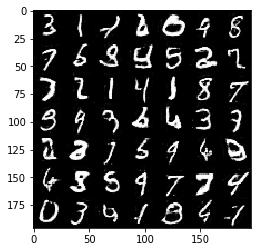

Epoch 2/2... Discriminator Loss: 1.1629... Generator Loss: 0.5281
Epoch 2/2... Discriminator Loss: 1.3878... Generator Loss: 0.4116
Epoch 2/2... Discriminator Loss: 1.9041... Generator Loss: 0.1875
Epoch 2/2... Discriminator Loss: 1.1808... Generator Loss: 0.4930
Epoch 2/2... Discriminator Loss: 3.0408... Generator Loss: 0.0891
Epoch 2/2... Discriminator Loss: 0.8408... Generator Loss: 1.2394
Epoch 2/2... Discriminator Loss: 1.7176... Generator Loss: 0.3822
Epoch 2/2... Discriminator Loss: 2.0849... Generator Loss: 0.1762
Epoch 2/2... Discriminator Loss: 1.4707... Generator Loss: 0.4009
Epoch 2/2... Discriminator Loss: 1.4266... Generator Loss: 0.5714


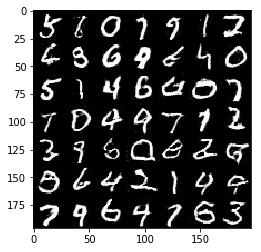

Epoch 2/2... Discriminator Loss: 1.5815... Generator Loss: 0.3871
Epoch 2/2... Discriminator Loss: 2.1260... Generator Loss: 0.1797
Epoch 2/2... Discriminator Loss: 1.4018... Generator Loss: 0.5057
Epoch 2/2... Discriminator Loss: 1.3553... Generator Loss: 0.4082
Epoch 2/2... Discriminator Loss: 2.1450... Generator Loss: 0.2242
Epoch 2/2... Discriminator Loss: 1.1040... Generator Loss: 0.6401
Epoch 2/2... Discriminator Loss: 1.9187... Generator Loss: 0.2166
Epoch 2/2... Discriminator Loss: 0.9868... Generator Loss: 1.4643
Epoch 2/2... Discriminator Loss: 1.0453... Generator Loss: 0.8106
Epoch 2/2... Discriminator Loss: 1.5986... Generator Loss: 0.4755


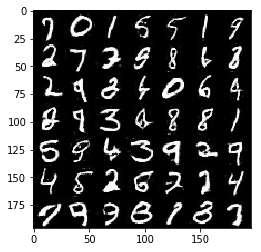

Epoch 2/2... Discriminator Loss: 1.4465... Generator Loss: 0.4514
Epoch 2/2... Discriminator Loss: 1.5950... Generator Loss: 0.6739
Epoch 2/2... Discriminator Loss: 2.2100... Generator Loss: 0.1901
Epoch 2/2... Discriminator Loss: 2.1820... Generator Loss: 0.1599
Epoch 2/2... Discriminator Loss: 1.6099... Generator Loss: 0.3286
Epoch 2/2... Discriminator Loss: 1.4962... Generator Loss: 0.3195
Epoch 2/2... Discriminator Loss: 1.4967... Generator Loss: 0.3321
Epoch 2/2... Discriminator Loss: 1.2851... Generator Loss: 0.4366
Epoch 2/2... Discriminator Loss: 1.3144... Generator Loss: 0.6004
Epoch 2/2... Discriminator Loss: 1.7913... Generator Loss: 0.2926


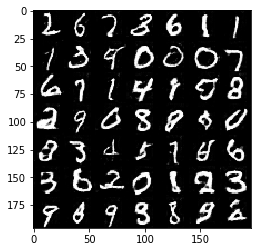

In [ ]:
batch_size = 16
z_dim = 100
learning_rate = 0.0002
beta1 = 0.5


"""
DON'T MODIFY ANYTHING IN THIS CELL THAT IS BELOW THIS LINE
"""
epochs = 2

mnist_dataset = helper.Dataset('mnist', glob(os.path.join(data_dir, 'mnist/*.jpg')))
with tf.Graph().as_default():
    train(epochs, batch_size, z_dim, learning_rate, beta1, mnist_dataset.get_batches,
          mnist_dataset.shape, mnist_dataset.image_mode)

### CelebA
Run your GANs on CelebA.  It will take around 20 minutes on the average GPU to run one epoch.  You can run the whole epoch or stop when it starts to generate realistic faces.

Epoch 1/1... Discriminator Loss: 3.2647... Generator Loss: 0.0725
Epoch 1/1... Discriminator Loss: 3.3260... Generator Loss: 0.0660
Epoch 1/1... Discriminator Loss: 3.1811... Generator Loss: 0.0710
Epoch 1/1... Discriminator Loss: 3.1689... Generator Loss: 0.0756
Epoch 1/1... Discriminator Loss: 3.2517... Generator Loss: 0.0761
Epoch 1/1... Discriminator Loss: 3.1015... Generator Loss: 0.0782
Epoch 1/1... Discriminator Loss: 3.4416... Generator Loss: 0.0746
Epoch 1/1... Discriminator Loss: 3.2049... Generator Loss: 0.0756
Epoch 1/1... Discriminator Loss: 3.3264... Generator Loss: 0.0843
Epoch 1/1... Discriminator Loss: 3.1705... Generator Loss: 0.0924


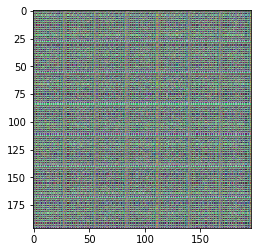

Epoch 1/1... Discriminator Loss: 3.0485... Generator Loss: 0.1021
Epoch 1/1... Discriminator Loss: 3.0721... Generator Loss: 0.1067
Epoch 1/1... Discriminator Loss: 2.9298... Generator Loss: 0.1189
Epoch 1/1... Discriminator Loss: 3.3563... Generator Loss: 0.1315
Epoch 1/1... Discriminator Loss: 2.9733... Generator Loss: 0.1351
Epoch 1/1... Discriminator Loss: 3.0439... Generator Loss: 0.1477
Epoch 1/1... Discriminator Loss: 3.2247... Generator Loss: 0.1598
Epoch 1/1... Discriminator Loss: 2.8816... Generator Loss: 0.1727
Epoch 1/1... Discriminator Loss: 2.7169... Generator Loss: 0.1884
Epoch 1/1... Discriminator Loss: 2.6949... Generator Loss: 0.2055


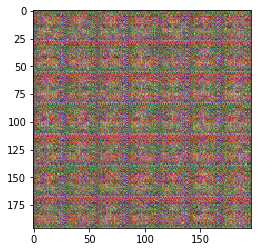

Epoch 1/1... Discriminator Loss: 2.6450... Generator Loss: 0.2263
Epoch 1/1... Discriminator Loss: 2.5984... Generator Loss: 0.2403
Epoch 1/1... Discriminator Loss: 2.7333... Generator Loss: 0.2504
Epoch 1/1... Discriminator Loss: 2.6723... Generator Loss: 0.2785
Epoch 1/1... Discriminator Loss: 2.8845... Generator Loss: 0.3163
Epoch 1/1... Discriminator Loss: 2.5714... Generator Loss: 0.3218
Epoch 1/1... Discriminator Loss: 2.4778... Generator Loss: 0.3843
Epoch 1/1... Discriminator Loss: 2.4639... Generator Loss: 0.3782
Epoch 1/1... Discriminator Loss: 2.8256... Generator Loss: 0.3510
Epoch 1/1... Discriminator Loss: 2.8988... Generator Loss: 0.3113


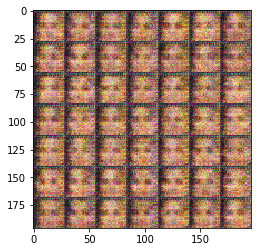

Epoch 1/1... Discriminator Loss: 2.5978... Generator Loss: 0.3659
Epoch 1/1... Discriminator Loss: 2.5053... Generator Loss: 0.4154
Epoch 1/1... Discriminator Loss: 2.0641... Generator Loss: 0.4708
Epoch 1/1... Discriminator Loss: 2.4379... Generator Loss: 0.3744
Epoch 1/1... Discriminator Loss: 3.2982... Generator Loss: 0.3151
Epoch 1/1... Discriminator Loss: 2.8555... Generator Loss: 0.2935
Epoch 1/1... Discriminator Loss: 2.2696... Generator Loss: 0.3942
Epoch 1/1... Discriminator Loss: 3.0128... Generator Loss: 0.4172
Epoch 1/1... Discriminator Loss: 2.2609... Generator Loss: 0.4864
Epoch 1/1... Discriminator Loss: 2.4515... Generator Loss: 0.5565


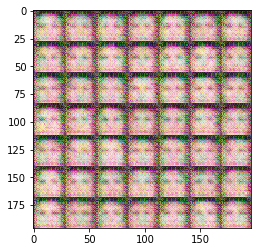

Epoch 1/1... Discriminator Loss: 2.3675... Generator Loss: 0.5220
Epoch 1/1... Discriminator Loss: 2.5751... Generator Loss: 0.4825
Epoch 1/1... Discriminator Loss: 2.4033... Generator Loss: 0.4877
Epoch 1/1... Discriminator Loss: 2.6595... Generator Loss: 0.5095
Epoch 1/1... Discriminator Loss: 2.2421... Generator Loss: 0.4890
Epoch 1/1... Discriminator Loss: 2.5528... Generator Loss: 0.4613
Epoch 1/1... Discriminator Loss: 2.3534... Generator Loss: 0.5745
Epoch 1/1... Discriminator Loss: 2.5065... Generator Loss: 0.4703
Epoch 1/1... Discriminator Loss: 2.3698... Generator Loss: 0.5011
Epoch 1/1... Discriminator Loss: 2.5450... Generator Loss: 0.5505


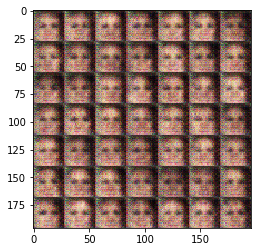

Epoch 1/1... Discriminator Loss: 2.2272... Generator Loss: 0.4501
Epoch 1/1... Discriminator Loss: 2.6442... Generator Loss: 0.4047
Epoch 1/1... Discriminator Loss: 2.9830... Generator Loss: 0.4421
Epoch 1/1... Discriminator Loss: 2.9971... Generator Loss: 0.3553
Epoch 1/1... Discriminator Loss: 2.7522... Generator Loss: 0.3639
Epoch 1/1... Discriminator Loss: 2.3927... Generator Loss: 0.4757
Epoch 1/1... Discriminator Loss: 2.7249... Generator Loss: 0.3405
Epoch 1/1... Discriminator Loss: 2.3302... Generator Loss: 0.4149
Epoch 1/1... Discriminator Loss: 2.5013... Generator Loss: 0.4236
Epoch 1/1... Discriminator Loss: 2.1597... Generator Loss: 0.4947


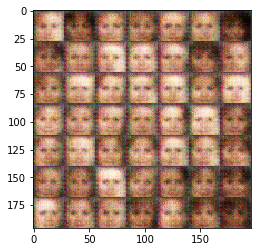

Epoch 1/1... Discriminator Loss: 2.4842... Generator Loss: 0.4159
Epoch 1/1... Discriminator Loss: 2.2528... Generator Loss: 0.5138
Epoch 1/1... Discriminator Loss: 2.3859... Generator Loss: 0.5038
Epoch 1/1... Discriminator Loss: 2.1138... Generator Loss: 0.5098
Epoch 1/1... Discriminator Loss: 2.3218... Generator Loss: 0.5033
Epoch 1/1... Discriminator Loss: 2.1451... Generator Loss: 0.4197
Epoch 1/1... Discriminator Loss: 2.5147... Generator Loss: 0.3843
Epoch 1/1... Discriminator Loss: 2.4983... Generator Loss: 0.2937
Epoch 1/1... Discriminator Loss: 2.3806... Generator Loss: 0.3213
Epoch 1/1... Discriminator Loss: 2.0372... Generator Loss: 0.3917


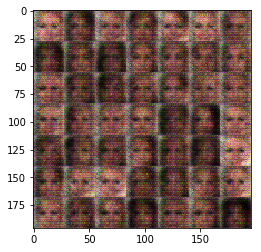

Epoch 1/1... Discriminator Loss: 1.9604... Generator Loss: 0.4334
Epoch 1/1... Discriminator Loss: 2.1574... Generator Loss: 0.4177
Epoch 1/1... Discriminator Loss: 2.3538... Generator Loss: 0.4031
Epoch 1/1... Discriminator Loss: 2.2412... Generator Loss: 0.4082
Epoch 1/1... Discriminator Loss: 2.6411... Generator Loss: 0.4173
Epoch 1/1... Discriminator Loss: 2.3971... Generator Loss: 0.4721
Epoch 1/1... Discriminator Loss: 2.4479... Generator Loss: 0.5050
Epoch 1/1... Discriminator Loss: 2.2508... Generator Loss: 0.4930
Epoch 1/1... Discriminator Loss: 2.4133... Generator Loss: 0.4198
Epoch 1/1... Discriminator Loss: 2.3235... Generator Loss: 0.4625


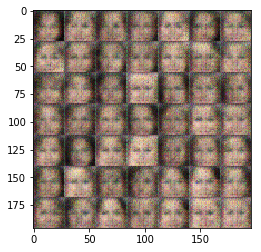

Epoch 1/1... Discriminator Loss: 2.3883... Generator Loss: 0.4311
Epoch 1/1... Discriminator Loss: 2.3049... Generator Loss: 0.4746
Epoch 1/1... Discriminator Loss: 2.1759... Generator Loss: 0.4299
Epoch 1/1... Discriminator Loss: 2.4218... Generator Loss: 0.3861
Epoch 1/1... Discriminator Loss: 2.3697... Generator Loss: 0.3816
Epoch 1/1... Discriminator Loss: 2.2368... Generator Loss: 0.3854
Epoch 1/1... Discriminator Loss: 2.2494... Generator Loss: 0.4119
Epoch 1/1... Discriminator Loss: 2.2610... Generator Loss: 0.4183
Epoch 1/1... Discriminator Loss: 2.1380... Generator Loss: 0.4236
Epoch 1/1... Discriminator Loss: 2.3415... Generator Loss: 0.3790


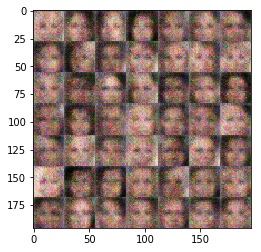

Epoch 1/1... Discriminator Loss: 2.2483... Generator Loss: 0.4355
Epoch 1/1... Discriminator Loss: 2.4358... Generator Loss: 0.3443
Epoch 1/1... Discriminator Loss: 2.4606... Generator Loss: 0.3660
Epoch 1/1... Discriminator Loss: 2.4178... Generator Loss: 0.3954
Epoch 1/1... Discriminator Loss: 2.4744... Generator Loss: 0.3408
Epoch 1/1... Discriminator Loss: 2.3356... Generator Loss: 0.3630
Epoch 1/1... Discriminator Loss: 2.4495... Generator Loss: 0.3714
Epoch 1/1... Discriminator Loss: 2.4241... Generator Loss: 0.3570
Epoch 1/1... Discriminator Loss: 2.3901... Generator Loss: 0.3464
Epoch 1/1... Discriminator Loss: 2.4165... Generator Loss: 0.3781


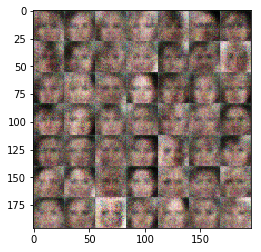

Epoch 1/1... Discriminator Loss: 2.3370... Generator Loss: 0.3376
Epoch 1/1... Discriminator Loss: 2.3361... Generator Loss: 0.3497
Epoch 1/1... Discriminator Loss: 2.2412... Generator Loss: 0.3687
Epoch 1/1... Discriminator Loss: 2.3739... Generator Loss: 0.3666
Epoch 1/1... Discriminator Loss: 2.2674... Generator Loss: 0.3759
Epoch 1/1... Discriminator Loss: 2.2706... Generator Loss: 0.3785
Epoch 1/1... Discriminator Loss: 2.2969... Generator Loss: 0.3706
Epoch 1/1... Discriminator Loss: 2.3768... Generator Loss: 0.3838
Epoch 1/1... Discriminator Loss: 2.1860... Generator Loss: 0.3878
Epoch 1/1... Discriminator Loss: 2.2818... Generator Loss: 0.3687


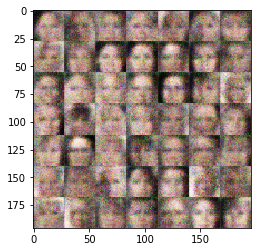

Epoch 1/1... Discriminator Loss: 2.2037... Generator Loss: 0.3574
Epoch 1/1... Discriminator Loss: 2.2506... Generator Loss: 0.3877
Epoch 1/1... Discriminator Loss: 2.3263... Generator Loss: 0.3470
Epoch 1/1... Discriminator Loss: 2.3110... Generator Loss: 0.3635
Epoch 1/1... Discriminator Loss: 2.2716... Generator Loss: 0.3961
Epoch 1/1... Discriminator Loss: 2.3066... Generator Loss: 0.3905
Epoch 1/1... Discriminator Loss: 2.1381... Generator Loss: 0.4091
Epoch 1/1... Discriminator Loss: 2.0620... Generator Loss: 0.4149
Epoch 1/1... Discriminator Loss: 2.1780... Generator Loss: 0.4444
Epoch 1/1... Discriminator Loss: 2.2844... Generator Loss: 0.4359


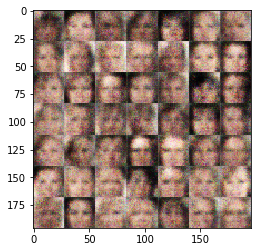

Epoch 1/1... Discriminator Loss: 2.2164... Generator Loss: 0.3996
Epoch 1/1... Discriminator Loss: 2.2595... Generator Loss: 0.4242
Epoch 1/1... Discriminator Loss: 2.1632... Generator Loss: 0.4288
Epoch 1/1... Discriminator Loss: 2.2665... Generator Loss: 0.3997
Epoch 1/1... Discriminator Loss: 2.3150... Generator Loss: 0.4176
Epoch 1/1... Discriminator Loss: 2.2413... Generator Loss: 0.4156
Epoch 1/1... Discriminator Loss: 2.3169... Generator Loss: 0.3922
Epoch 1/1... Discriminator Loss: 2.2484... Generator Loss: 0.4023
Epoch 1/1... Discriminator Loss: 2.2373... Generator Loss: 0.4161
Epoch 1/1... Discriminator Loss: 2.2528... Generator Loss: 0.4221


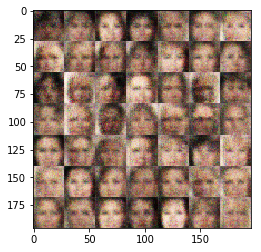

Epoch 1/1... Discriminator Loss: 2.2025... Generator Loss: 0.4268
Epoch 1/1... Discriminator Loss: 2.1806... Generator Loss: 0.4174
Epoch 1/1... Discriminator Loss: 2.1612... Generator Loss: 0.4366
Epoch 1/1... Discriminator Loss: 2.1203... Generator Loss: 0.4565
Epoch 1/1... Discriminator Loss: 2.0974... Generator Loss: 0.4613
Epoch 1/1... Discriminator Loss: 2.1490... Generator Loss: 0.4663
Epoch 1/1... Discriminator Loss: 2.2517... Generator Loss: 0.4162
Epoch 1/1... Discriminator Loss: 1.9939... Generator Loss: 0.4638
Epoch 1/1... Discriminator Loss: 2.1359... Generator Loss: 0.4330
Epoch 1/1... Discriminator Loss: 2.1166... Generator Loss: 0.4537


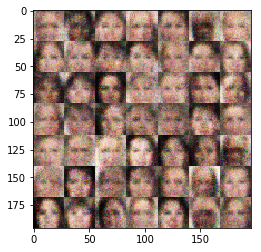

Epoch 1/1... Discriminator Loss: 2.0876... Generator Loss: 0.4477
Epoch 1/1... Discriminator Loss: 2.1243... Generator Loss: 0.4422
Epoch 1/1... Discriminator Loss: 2.0141... Generator Loss: 0.4432
Epoch 1/1... Discriminator Loss: 2.0006... Generator Loss: 0.4552
Epoch 1/1... Discriminator Loss: 2.0975... Generator Loss: 0.4681
Epoch 1/1... Discriminator Loss: 2.0992... Generator Loss: 0.4508
Epoch 1/1... Discriminator Loss: 2.0439... Generator Loss: 0.4674
Epoch 1/1... Discriminator Loss: 1.9958... Generator Loss: 0.4564
Epoch 1/1... Discriminator Loss: 2.0785... Generator Loss: 0.4475
Epoch 1/1... Discriminator Loss: 2.0437... Generator Loss: 0.4764


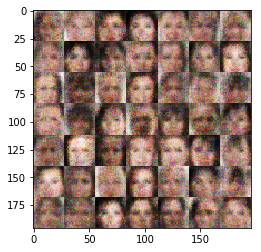

Epoch 1/1... Discriminator Loss: 2.0653... Generator Loss: 0.4481
Epoch 1/1... Discriminator Loss: 2.0383... Generator Loss: 0.4304
Epoch 1/1... Discriminator Loss: 2.0263... Generator Loss: 0.4413
Epoch 1/1... Discriminator Loss: 2.0819... Generator Loss: 0.4404
Epoch 1/1... Discriminator Loss: 2.0157... Generator Loss: 0.4780
Epoch 1/1... Discriminator Loss: 1.9731... Generator Loss: 0.4728
Epoch 1/1... Discriminator Loss: 1.9686... Generator Loss: 0.4685
Epoch 1/1... Discriminator Loss: 2.0697... Generator Loss: 0.4371
Epoch 1/1... Discriminator Loss: 2.0081... Generator Loss: 0.4682
Epoch 1/1... Discriminator Loss: 1.9321... Generator Loss: 0.4676


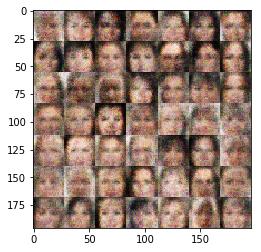

Epoch 1/1... Discriminator Loss: 2.0381... Generator Loss: 0.4345
Epoch 1/1... Discriminator Loss: 1.9084... Generator Loss: 0.4457
Epoch 1/1... Discriminator Loss: 1.9471... Generator Loss: 0.4637
Epoch 1/1... Discriminator Loss: 2.0131... Generator Loss: 0.4377
Epoch 1/1... Discriminator Loss: 1.9242... Generator Loss: 0.5201
Epoch 1/1... Discriminator Loss: 1.9206... Generator Loss: 0.4794
Epoch 1/1... Discriminator Loss: 1.9318... Generator Loss: 0.4839
Epoch 1/1... Discriminator Loss: 1.9686... Generator Loss: 0.4778
Epoch 1/1... Discriminator Loss: 1.9342... Generator Loss: 0.4647
Epoch 1/1... Discriminator Loss: 1.9198... Generator Loss: 0.4750


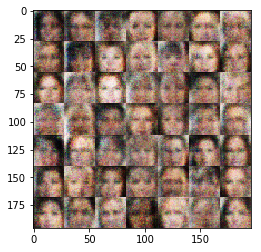

Epoch 1/1... Discriminator Loss: 1.9869... Generator Loss: 0.4508
Epoch 1/1... Discriminator Loss: 1.9966... Generator Loss: 0.4762
Epoch 1/1... Discriminator Loss: 1.9624... Generator Loss: 0.4926
Epoch 1/1... Discriminator Loss: 1.9810... Generator Loss: 0.4843
Epoch 1/1... Discriminator Loss: 1.9285... Generator Loss: 0.4935
Epoch 1/1... Discriminator Loss: 1.9039... Generator Loss: 0.4842
Epoch 1/1... Discriminator Loss: 1.8879... Generator Loss: 0.4843
Epoch 1/1... Discriminator Loss: 1.8570... Generator Loss: 0.4966
Epoch 1/1... Discriminator Loss: 1.8827... Generator Loss: 0.4874
Epoch 1/1... Discriminator Loss: 1.8335... Generator Loss: 0.5098


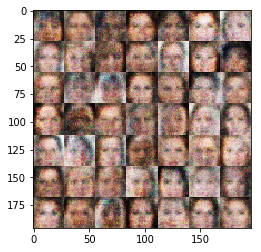

Epoch 1/1... Discriminator Loss: 2.0233... Generator Loss: 0.4989
Epoch 1/1... Discriminator Loss: 1.9598... Generator Loss: 0.4691
Epoch 1/1... Discriminator Loss: 1.9183... Generator Loss: 0.4864
Epoch 1/1... Discriminator Loss: 1.9199... Generator Loss: 0.4974
Epoch 1/1... Discriminator Loss: 1.8575... Generator Loss: 0.4802
Epoch 1/1... Discriminator Loss: 1.9084... Generator Loss: 0.4938
Epoch 1/1... Discriminator Loss: 1.9099... Generator Loss: 0.5106
Epoch 1/1... Discriminator Loss: 1.9133... Generator Loss: 0.4850
Epoch 1/1... Discriminator Loss: 1.8706... Generator Loss: 0.4921
Epoch 1/1... Discriminator Loss: 1.9316... Generator Loss: 0.4981


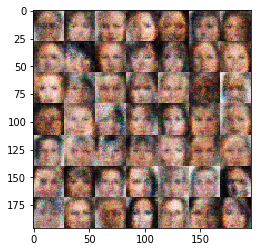

Epoch 1/1... Discriminator Loss: 1.8461... Generator Loss: 0.4802
Epoch 1/1... Discriminator Loss: 1.8699... Generator Loss: 0.4899
Epoch 1/1... Discriminator Loss: 1.9067... Generator Loss: 0.5032
Epoch 1/1... Discriminator Loss: 1.7932... Generator Loss: 0.5198
Epoch 1/1... Discriminator Loss: 1.7389... Generator Loss: 0.5201
Epoch 1/1... Discriminator Loss: 1.8864... Generator Loss: 0.5015
Epoch 1/1... Discriminator Loss: 1.8406... Generator Loss: 0.5196
Epoch 1/1... Discriminator Loss: 1.8624... Generator Loss: 0.5314
Epoch 1/1... Discriminator Loss: 1.8192... Generator Loss: 0.5175
Epoch 1/1... Discriminator Loss: 1.8064... Generator Loss: 0.5095


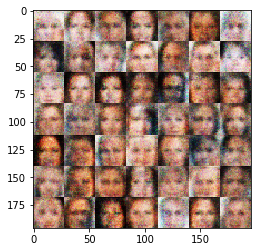

Epoch 1/1... Discriminator Loss: 1.7978... Generator Loss: 0.5056
Epoch 1/1... Discriminator Loss: 1.7931... Generator Loss: 0.5146
Epoch 1/1... Discriminator Loss: 1.7983... Generator Loss: 0.5352
Epoch 1/1... Discriminator Loss: 1.9038... Generator Loss: 0.5214
Epoch 1/1... Discriminator Loss: 1.8270... Generator Loss: 0.5172
Epoch 1/1... Discriminator Loss: 1.7837... Generator Loss: 0.5430
Epoch 1/1... Discriminator Loss: 1.7634... Generator Loss: 0.5210
Epoch 1/1... Discriminator Loss: 1.8087... Generator Loss: 0.5214
Epoch 1/1... Discriminator Loss: 1.8105... Generator Loss: 0.5100
Epoch 1/1... Discriminator Loss: 1.7486... Generator Loss: 0.5329


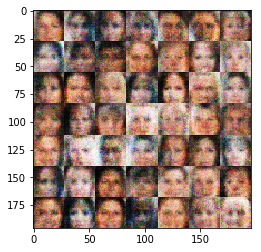

Epoch 1/1... Discriminator Loss: 1.7545... Generator Loss: 0.5569
Epoch 1/1... Discriminator Loss: 1.8316... Generator Loss: 0.5589
Epoch 1/1... Discriminator Loss: 1.8516... Generator Loss: 0.5312
Epoch 1/1... Discriminator Loss: 1.8052... Generator Loss: 0.5298
Epoch 1/1... Discriminator Loss: 1.8077... Generator Loss: 0.5167
Epoch 1/1... Discriminator Loss: 1.7988... Generator Loss: 0.5481
Epoch 1/1... Discriminator Loss: 1.7337... Generator Loss: 0.5458
Epoch 1/1... Discriminator Loss: 1.8040... Generator Loss: 0.5485
Epoch 1/1... Discriminator Loss: 1.7713... Generator Loss: 0.5296
Epoch 1/1... Discriminator Loss: 1.8325... Generator Loss: 0.5153


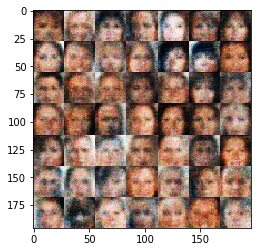

Epoch 1/1... Discriminator Loss: 1.7859... Generator Loss: 0.5128
Epoch 1/1... Discriminator Loss: 1.7728... Generator Loss: 0.5364
Epoch 1/1... Discriminator Loss: 1.7331... Generator Loss: 0.5236
Epoch 1/1... Discriminator Loss: 1.7815... Generator Loss: 0.5447
Epoch 1/1... Discriminator Loss: 1.7666... Generator Loss: 0.5538
Epoch 1/1... Discriminator Loss: 1.7589... Generator Loss: 0.5359
Epoch 1/1... Discriminator Loss: 1.7882... Generator Loss: 0.5238
Epoch 1/1... Discriminator Loss: 1.7464... Generator Loss: 0.5354
Epoch 1/1... Discriminator Loss: 1.7087... Generator Loss: 0.5461
Epoch 1/1... Discriminator Loss: 1.7761... Generator Loss: 0.5480


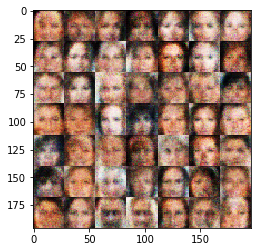

Epoch 1/1... Discriminator Loss: 1.8071... Generator Loss: 0.5321
Epoch 1/1... Discriminator Loss: 1.7376... Generator Loss: 0.5275
Epoch 1/1... Discriminator Loss: 1.7331... Generator Loss: 0.5382
Epoch 1/1... Discriminator Loss: 1.7586... Generator Loss: 0.5392
Epoch 1/1... Discriminator Loss: 1.7894... Generator Loss: 0.5424
Epoch 1/1... Discriminator Loss: 1.7461... Generator Loss: 0.5447
Epoch 1/1... Discriminator Loss: 1.7346... Generator Loss: 0.5541
Epoch 1/1... Discriminator Loss: 1.6698... Generator Loss: 0.5339
Epoch 1/1... Discriminator Loss: 1.7404... Generator Loss: 0.5237
Epoch 1/1... Discriminator Loss: 1.6668... Generator Loss: 0.5587


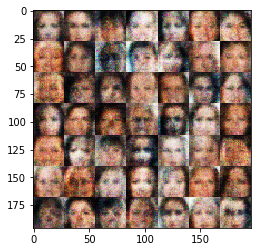

Epoch 1/1... Discriminator Loss: 1.6744... Generator Loss: 0.5576
Epoch 1/1... Discriminator Loss: 1.6906... Generator Loss: 0.5626
Epoch 1/1... Discriminator Loss: 1.7076... Generator Loss: 0.5484
Epoch 1/1... Discriminator Loss: 1.7149... Generator Loss: 0.5404
Epoch 1/1... Discriminator Loss: 1.7563... Generator Loss: 0.5474
Epoch 1/1... Discriminator Loss: 1.6626... Generator Loss: 0.5627
Epoch 1/1... Discriminator Loss: 1.7757... Generator Loss: 0.5361
Epoch 1/1... Discriminator Loss: 1.7120... Generator Loss: 0.5699
Epoch 1/1... Discriminator Loss: 1.7234... Generator Loss: 0.5440
Epoch 1/1... Discriminator Loss: 1.7085... Generator Loss: 0.5574


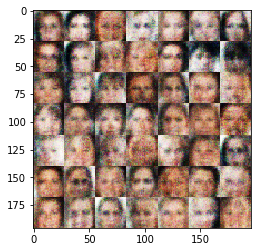

Epoch 1/1... Discriminator Loss: 1.6996... Generator Loss: 0.5670
Epoch 1/1... Discriminator Loss: 1.7521... Generator Loss: 0.5611
Epoch 1/1... Discriminator Loss: 1.6935... Generator Loss: 0.5567
Epoch 1/1... Discriminator Loss: 1.7110... Generator Loss: 0.5611
Epoch 1/1... Discriminator Loss: 1.6743... Generator Loss: 0.5530
Epoch 1/1... Discriminator Loss: 1.6746... Generator Loss: 0.5632
Epoch 1/1... Discriminator Loss: 1.6738... Generator Loss: 0.5524
Epoch 1/1... Discriminator Loss: 1.7143... Generator Loss: 0.5492
Epoch 1/1... Discriminator Loss: 1.7170... Generator Loss: 0.5348
Epoch 1/1... Discriminator Loss: 1.6553... Generator Loss: 0.5808


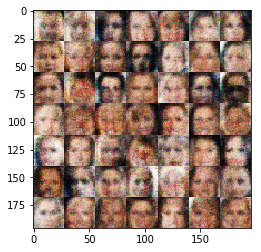

Epoch 1/1... Discriminator Loss: 1.6913... Generator Loss: 0.5504
Epoch 1/1... Discriminator Loss: 1.6686... Generator Loss: 0.5814
Epoch 1/1... Discriminator Loss: 1.6622... Generator Loss: 0.5332
Epoch 1/1... Discriminator Loss: 1.7252... Generator Loss: 0.5495
Epoch 1/1... Discriminator Loss: 1.7043... Generator Loss: 0.5722
Epoch 1/1... Discriminator Loss: 1.6777... Generator Loss: 0.5587
Epoch 1/1... Discriminator Loss: 1.6679... Generator Loss: 0.5620
Epoch 1/1... Discriminator Loss: 1.6838... Generator Loss: 0.5619
Epoch 1/1... Discriminator Loss: 1.6949... Generator Loss: 0.5842
Epoch 1/1... Discriminator Loss: 1.6314... Generator Loss: 0.5537


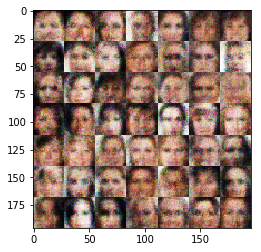

Epoch 1/1... Discriminator Loss: 1.6328... Generator Loss: 0.5855
Epoch 1/1... Discriminator Loss: 1.6754... Generator Loss: 0.5549
Epoch 1/1... Discriminator Loss: 1.7111... Generator Loss: 0.5494
Epoch 1/1... Discriminator Loss: 1.6750... Generator Loss: 0.5470
Epoch 1/1... Discriminator Loss: 1.7125... Generator Loss: 0.5814
Epoch 1/1... Discriminator Loss: 1.6707... Generator Loss: 0.5858
Epoch 1/1... Discriminator Loss: 1.6099... Generator Loss: 0.5583
Epoch 1/1... Discriminator Loss: 1.6487... Generator Loss: 0.5724
Epoch 1/1... Discriminator Loss: 1.6541... Generator Loss: 0.5883
Epoch 1/1... Discriminator Loss: 1.6380... Generator Loss: 0.5648


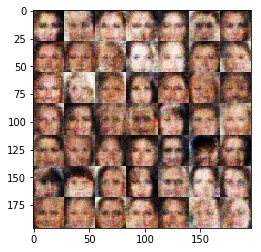

Epoch 1/1... Discriminator Loss: 1.6364... Generator Loss: 0.5790
Epoch 1/1... Discriminator Loss: 1.6604... Generator Loss: 0.5828
Epoch 1/1... Discriminator Loss: 1.6341... Generator Loss: 0.5708
Epoch 1/1... Discriminator Loss: 1.6417... Generator Loss: 0.5950
Epoch 1/1... Discriminator Loss: 1.6333... Generator Loss: 0.5748
Epoch 1/1... Discriminator Loss: 1.6160... Generator Loss: 0.5726
Epoch 1/1... Discriminator Loss: 1.6304... Generator Loss: 0.5635
Epoch 1/1... Discriminator Loss: 1.6376... Generator Loss: 0.5829
Epoch 1/1... Discriminator Loss: 1.6391... Generator Loss: 0.5758
Epoch 1/1... Discriminator Loss: 1.6395... Generator Loss: 0.5631


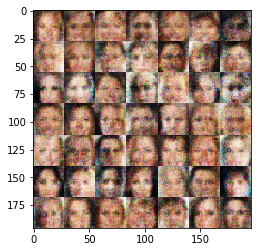

Epoch 1/1... Discriminator Loss: 1.6658... Generator Loss: 0.5565
Epoch 1/1... Discriminator Loss: 1.6305... Generator Loss: 0.5779
Epoch 1/1... Discriminator Loss: 1.6263... Generator Loss: 0.5736
Epoch 1/1... Discriminator Loss: 1.6350... Generator Loss: 0.5713
Epoch 1/1... Discriminator Loss: 1.6165... Generator Loss: 0.5767
Epoch 1/1... Discriminator Loss: 1.6441... Generator Loss: 0.5687
Epoch 1/1... Discriminator Loss: 1.6643... Generator Loss: 0.6006
Epoch 1/1... Discriminator Loss: 1.6052... Generator Loss: 0.5815
Epoch 1/1... Discriminator Loss: 1.5893... Generator Loss: 0.5775
Epoch 1/1... Discriminator Loss: 1.6476... Generator Loss: 0.5941


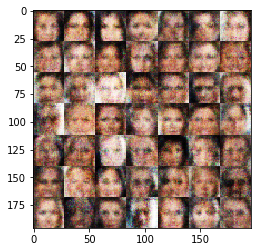

Epoch 1/1... Discriminator Loss: 1.6226... Generator Loss: 0.5742
Epoch 1/1... Discriminator Loss: 1.6440... Generator Loss: 0.5581
Epoch 1/1... Discriminator Loss: 1.6195... Generator Loss: 0.5925
Epoch 1/1... Discriminator Loss: 1.6854... Generator Loss: 0.5859
Epoch 1/1... Discriminator Loss: 1.6233... Generator Loss: 0.5615
Epoch 1/1... Discriminator Loss: 1.6725... Generator Loss: 0.5822
Epoch 1/1... Discriminator Loss: 1.6283... Generator Loss: 0.6010
Epoch 1/1... Discriminator Loss: 1.6179... Generator Loss: 0.5783
Epoch 1/1... Discriminator Loss: 1.6411... Generator Loss: 0.5883
Epoch 1/1... Discriminator Loss: 1.6152... Generator Loss: 0.5638


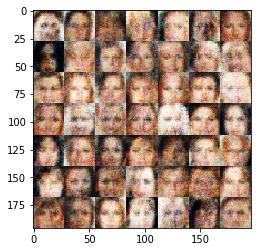

Epoch 1/1... Discriminator Loss: 1.5708... Generator Loss: 0.5966
Epoch 1/1... Discriminator Loss: 1.6161... Generator Loss: 0.6021
Epoch 1/1... Discriminator Loss: 1.6024... Generator Loss: 0.5807
Epoch 1/1... Discriminator Loss: 1.5677... Generator Loss: 0.5972
Epoch 1/1... Discriminator Loss: 1.6204... Generator Loss: 0.5866


In [ ]:
batch_size = 64
z_dim = 128
learning_rate = 0.00001
beta1 = 0.5


"""
DON'T MODIFY ANYTHING IN THIS CELL THAT IS BELOW THIS LINE
"""
epochs = 1

celeba_dataset = helper.Dataset('celeba', glob(os.path.join(data_dir, 'img_align_celeba/*.jpg')))
with tf.Graph().as_default():
    train(epochs, batch_size, z_dim, learning_rate, beta1, celeba_dataset.get_batches,
          celeba_dataset.shape, celeba_dataset.image_mode)

### Submitting This Project
When submitting this project, make sure to run all the cells before saving the notebook. Save the notebook file as "dlnd_face_generation.ipynb" and save it as a HTML file under "File" -> "Download as". Include the "helper.py" and "problem_unittests.py" files in your submission.